**Problem Statement:**



*   Rossmann is a European drug distributor which operates over 3,000 drug stores across seven European countries. Since a lot of drugs come with a short shelf life, that is, they do not have a long expiry date, it becomes imperative for Rossmann to accurately forecast sales at their individual stores. Currently, the forecasting is taken care of by the store managers who are tasked with forecasting daily sales for the next six weeks.


*   As expected, store sales are influenced by many factors, including promotional campaigns, competition, state holidays, seasonality, and locality.



*   With thousands of individual managers predicting sales based on their unique circumstances and intuitions, the accuracy of the forecasts is quite varied. To overcome this problem, the company has hired you as a data scientist to work on the forecasting problem. As part of your job role, you are tasked with building a forecasting model to forecast the daily sales for the next six weeks.




In [3]:
## Importing Necessary Libraries

import warnings 
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from pandas import datetime
from sklearn.metrics import mean_squared_error

from pylab import rcParams
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss
from scipy.stats import boxcox

In [6]:
## Reading the datasets

train = pd.read_csv('/content/drive/MyDrive/Capston Project/train.csv', parse_dates= True,index_col = 'Date')
store = pd.read_csv('/content/drive/MyDrive/Capston Project/store.csv')

In [7]:
train.head()


,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
Date,,,,,,,,
2015-07-31,1,5,5263,555,1,1,0,1
2015-07-31,2,5,6064,625,1,1,0,1
2015-07-31,3,5,8314,821,1,1,0,1
2015-07-31,4,5,13995,1498,1,1,0,1
2015-07-31,5,5,4822,559,1,1,0,1


In [8]:
print('train dataset shape',train.shape)
print('store dataset shape',store.shape)

train dataset shape (1017209, 8)
store dataset shape (1115, 10)


**DateTime Features**


*   As we are dealing with time series data, its better to extract dates for further analysis.

*  We can also create a new feature SalesPerCustomer





In [9]:
# creating new datetime features
train['Year'] = train.index.year
train['Month'] = train.index.month
train['Day'] = train.index.day
train['WeekOfYear'] = train.index.weekofyear
# creating a derived feature
train['SalePerCustomer'] = train['Sales']/train['Customers']
train.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Year,Month,Day,WeekOfYear,SalePerCustomer
Date,,,,,,,,,,,,,
2015-07-31,1,5,5263,555,1,1,0,1,2015,7,31,31,9.482883
2015-07-31,2,5,6064,625,1,1,0,1,2015,7,31,31,9.702400
2015-07-31,3,5,8314,821,1,1,0,1,2015,7,31,31,10.126675
2015-07-31,4,5,13995,1498,1,1,0,1,2015,7,31,31,9.342457
2015-07-31,5,5,4822,559,1,1,0,1,2015,7,31,31,8.626118


**Sanity Checks**


In [10]:
train.info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1017209 entries, 2015-07-31 to 2013-01-01
Data columns (total 13 columns):
 #   Column           Non-Null Count    Dtype  
---  ------           --------------    -----  
 0   Store            1017209 non-null  int64  
 1   DayOfWeek        1017209 non-null  int64  
 2   Sales            1017209 non-null  int64  
 3   Customers        1017209 non-null  int64  
 4   Open             1017209 non-null  int64  
 5   Promo            1017209 non-null  int64  
 6   StateHoliday     1017209 non-null  object 
 7   SchoolHoliday    1017209 non-null  int64  
 8   Year             1017209 non-null  int64  
 9   Month            1017209 non-null  int64  
 10  Day              1017209 non-null  int64  
 11  WeekOfYear       1017209 non-null  int64  
 12  SalePerCustomer  844340 non-null   float64
dtypes: float64(1), int64(11), object(1)
memory usage: 108.6+ MB


In [11]:
train.describe().T


,count,mean,std,min,25%,50%,75%,max
Store,1017209.0,558.429727,321.908651,1.0,280.000000,558.00,838.000000,1115.000000
DayOfWeek,1017209.0,3.998341,1.997391,1.0,2.000000,4.00,6.000000,7.000000
Sales,1017209.0,5773.818972,3849.926175,0.0,3727.000000,5744.00,7856.000000,41551.000000
Customers,1017209.0,633.145946,464.411734,0.0,405.000000,609.00,837.000000,7388.000000
Open,1017209.0,0.830107,0.375539,0.0,1.000000,1.00,1.000000,1.000000
Promo,1017209.0,0.381515,0.485759,0.0,0.000000,0.00,1.000000,1.000000
SchoolHoliday,1017209.0,0.178647,0.383056,0.0,0.000000,0.00,0.000000,1.000000
Year,1017209.0,2013.832292,0.777396,2013.0,2013.000000,2014.00,2014.000000,2015.000000
Month,1017209.0,5.846762,3.326097,1.0,3.000000,6.00,8.000000,12.000000
Day,1017209.0,15.702790,8.787638,1.0,8.000000,16.00,23.000000,31.000000


**Inference**:



*   The average sale per customer is 9.49

*   The stores have been opened for almost 83% of total days


*   Promotions were running for 38% of total days

*  Max sales have been 41,551


*   Max Sales per Customer is nearly 64.95







In [12]:
round(train.isnull().mean()*100,2)


Store               0.00
DayOfWeek           0.00
Sales               0.00
Customers           0.00
Open                0.00
Promo               0.00
StateHoliday        0.00
SchoolHoliday       0.00
Year                0.00
Month               0.00
Day                 0.00
WeekOfYear          0.00
SalePerCustomer    16.99
dtype: float64

Only the SalePerCustomer variable has null values equal to 16.99% wrt total data present



In [13]:
# Lets check closed stores:
train[train['Open']==0]['Open'].count()

172817

There are 172817 closed stores in our data. We'll drop these



In [14]:
# Lets check open stores and zero sales
train[(train['Open']!=0) & (train['Sales']==0)]['Open'].count()

54

There are 54 Stores which were open but had zero sales, this shows presence of some external factors



In [15]:
# closed stores and open store days with no sales are removed

train = train[(train['Open']!=0)&(train['Sales']!=0)]
train.shape

(844338, 13)

**Checking store dataset**


In [16]:
store.head()


,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


In [17]:
store.shape


(1115, 10)

In [18]:
store.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1115 entries, 0 to 1114
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Store                      1115 non-null   int64  
 1   StoreType                  1115 non-null   object 
 2   Assortment                 1115 non-null   object 
 3   CompetitionDistance        1112 non-null   float64
 4   CompetitionOpenSinceMonth  761 non-null    float64
 5   CompetitionOpenSinceYear   761 non-null    float64
 6   Promo2                     1115 non-null   int64  
 7   Promo2SinceWeek            571 non-null    float64
 8   Promo2SinceYear            571 non-null    float64
 9   PromoInterval              571 non-null    object 
dtypes: float64(5), int64(2), object(3)
memory usage: 87.2+ KB


In [19]:
store.describe().T


,count,mean,std,min,25%,50%,75%,max
Store,1115.0,558.000000,322.017080,1.0,279.5,558.0,836.5,1115.0
CompetitionDistance,1112.0,5404.901079,7663.174720,20.0,717.5,2325.0,6882.5,75860.0
CompetitionOpenSinceMonth,761.0,7.224704,3.212348,1.0,4.0,8.0,10.0,12.0
CompetitionOpenSinceYear,761.0,2008.668857,6.195983,1900.0,2006.0,2010.0,2013.0,2015.0
Promo2,1115.0,0.512108,0.500078,0.0,0.0,1.0,1.0,1.0
Promo2SinceWeek,571.0,23.595447,14.141984,1.0,13.0,22.0,37.0,50.0
Promo2SinceYear,571.0,2011.763573,1.674935,2009.0,2011.0,2012.0,2013.0,2015.0


In [20]:
round(store.isnull().mean()*100,2)


Store                         0.00
StoreType                     0.00
Assortment                    0.00
CompetitionDistance           0.27
CompetitionOpenSinceMonth    31.75
CompetitionOpenSinceYear     31.75
Promo2                        0.00
Promo2SinceWeek              48.79
Promo2SinceYear              48.79
PromoInterval                48.79
dtype: float64

We can clearly see the presence of null values in our dataset



In [21]:
store[store['CompetitionDistance'].isnull()]


,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
290,291,d,a,NaN,NaN,NaN,0,NaN,NaN,NaN
621,622,a,c,NaN,NaN,NaN,0,NaN,NaN,NaN
878,879,d,a,NaN,NaN,NaN,1,5.0,2013.0,"Feb,May,Aug,Nov"


It seems the values here are missing completely at random, dropping these from store



In [22]:
store['CompetitionDistance'] = store['CompetitionDistance'].fillna(store['CompetitionDistance'].median())


It makes no sense to have NaN values in remaining features of Promo and Competition, as it simply means



In [23]:
# replacing remaining NaNs by 0
store = store.fillna(0)

In [24]:
# checking if there's any remaining NaNs values
round(store.isnull().mean()*100)

Store                        0.0
StoreType                    0.0
Assortment                   0.0
CompetitionDistance          0.0
CompetitionOpenSinceMonth    0.0
CompetitionOpenSinceYear     0.0
Promo2                       0.0
Promo2SinceWeek              0.0
Promo2SinceYear              0.0
PromoInterval                0.0
dtype: float64

Successfully, imputed Na values



**Merging both the datasets**

In [25]:
train.reset_index(inplace=True)
rossmann = pd.merge(train, store, how='inner', on='Store')
rossmann.head()


,Date,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Year,...,SalePerCustomer,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,2015-07-31,1,5,5263,555,1,1,0,1,2015,...,9.482883,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
1,2015-07-30,1,4,5020,546,1,1,0,1,2015,...,9.194139,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
2,2015-07-29,1,3,4782,523,1,1,0,1,2015,...,9.143403,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
3,2015-07-28,1,2,5011,560,1,1,0,1,2015,...,8.948214,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
4,2015-07-27,1,1,6102,612,1,1,0,1,2015,...,9.970588,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0


5 rows × 23 columns



In [26]:
# dropping variable 'Open' as it has only 1 value:
rossmann = rossmann.drop('Open', axis=1)

In [27]:
rossmann.columns


Index(['Date', 'Store', 'DayOfWeek', 'Sales', 'Customers', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'Year', 'Month', 'Day', 'WeekOfYear',
       'SalePerCustomer', 'StoreType', 'Assortment', 'CompetitionDistance',
       'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Promo2',
       'Promo2SinceWeek', 'Promo2SinceYear', 'PromoInterval'],
      dtype='object')

**Exploratory Data Analysis**


In [28]:
# seperating the categorical and numerical columns
cat_cols = ['DayOfWeek','Promo','StateHoliday','StoreType','Assortment','Promo2','PromoInterval']
num_cols = ['Sales','Customers','SalePerCustomer','CompetitionDistance']
date_cols = ['DayOfWeek','Year','Month','Day']

In [30]:
#checking values of categorical variables
for col in cat_cols:
    print(col,': ',rossmann[col].unique())

DayOfWeek :  [5 4 3 2 1 6 7]
Promo :  [1 0]
StateHoliday :  ['0' 0 'a' 'b' 'c']
StoreType :  ['c' 'a' 'd' 'b']
Assortment :  ['a' 'c' 'b']
Promo2 :  [0 1]
PromoInterval :  [0 'Jan,Apr,Jul,Oct' 'Feb,May,Aug,Nov' 'Mar,Jun,Sept,Dec']


We can observe, in StateHoliday column, there are different values for the same state, so we'll make them as O



In [31]:
# StateHoliday has a mixture of 0 and "0", replace these with "O"
rossmann['StateHoliday'].replace([0,"0"],['O','O'], inplace=True)

Univariate Analysis


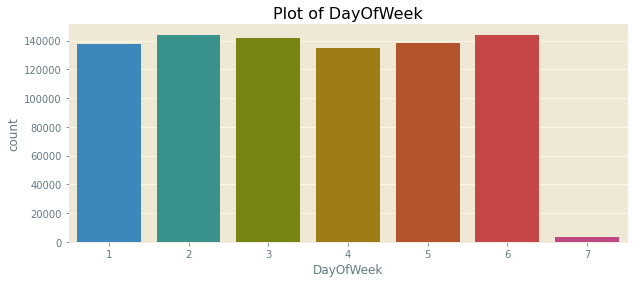

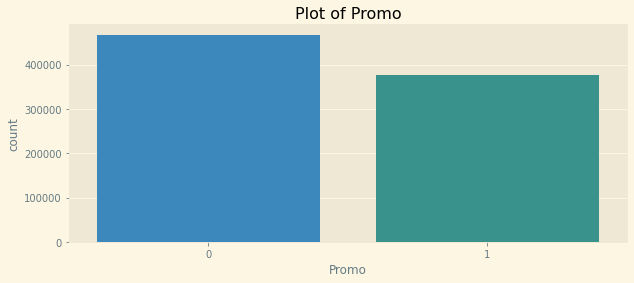

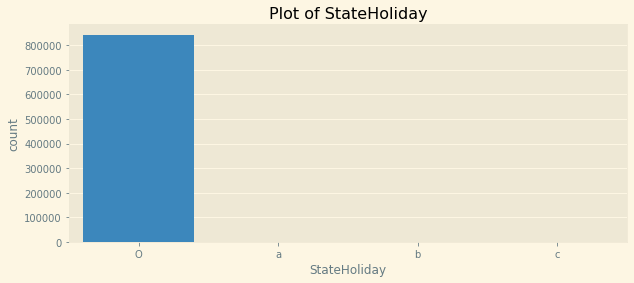

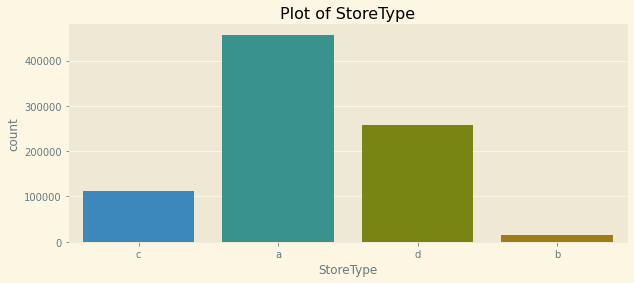

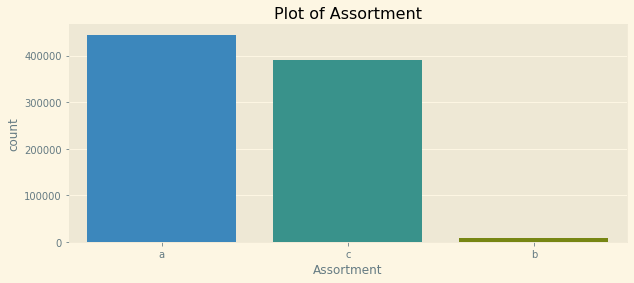

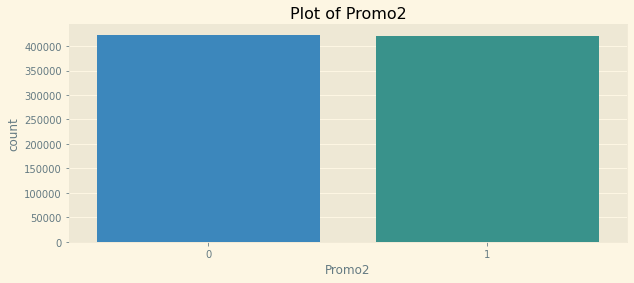

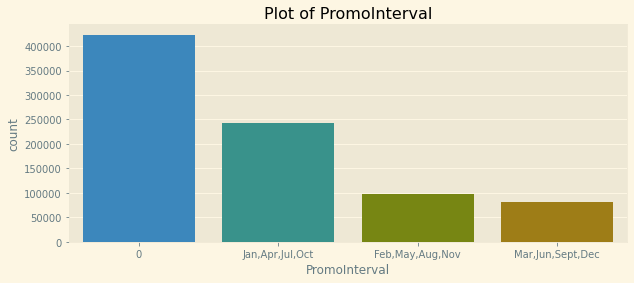

In [32]:
# checking categorical variables using countplot:

def count_cat(df, col):
    for c in col:
        plt.figure(figsize=[10,4])
        plt.style.use('Solarize_Light2')   
        sns.countplot(data=df, x=c)
        plt.title(f'Plot of {c}')
        plt.show()

count_cat(rossmann, cat_cols)

Inferences:

*   StoreType a has the highest value.

*   StateHoliday has only 1 value.


*   DayOfWeek 7 has the lowest value indicating the store was mainly closed on Sundays







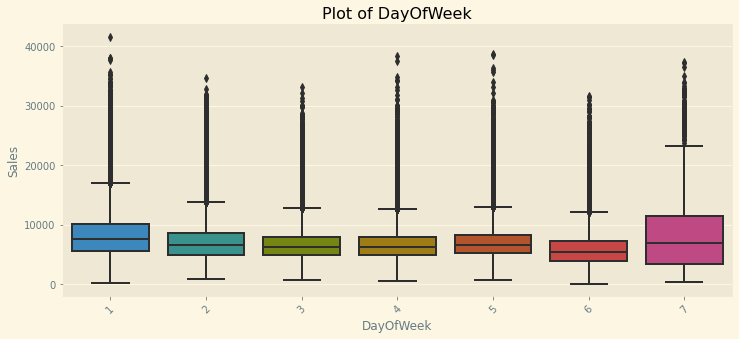

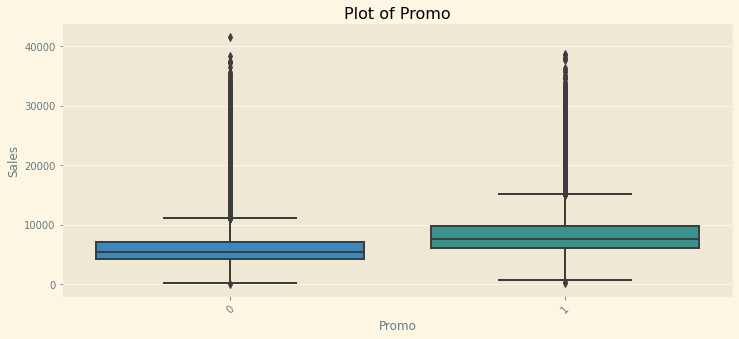

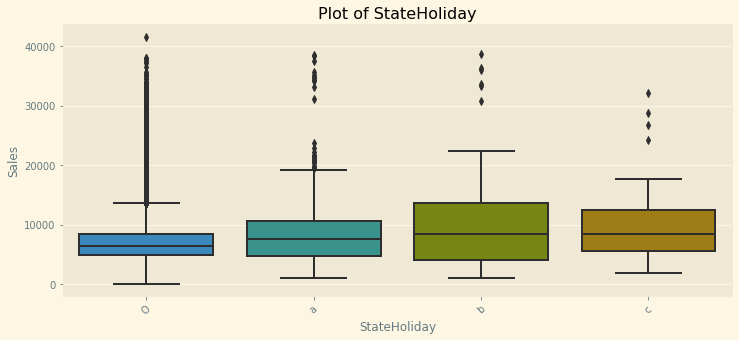

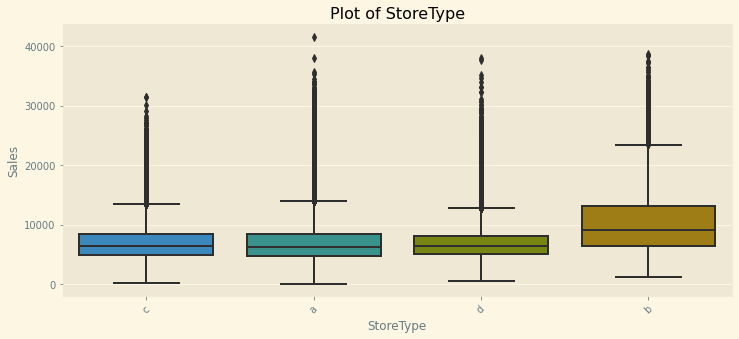

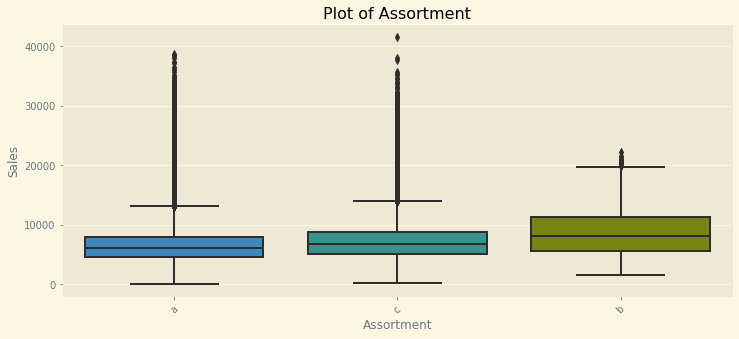

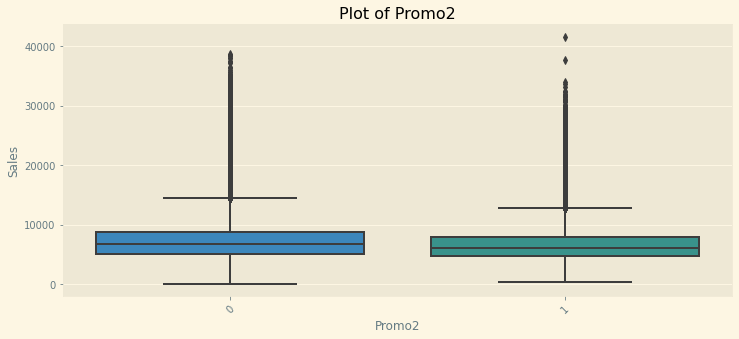

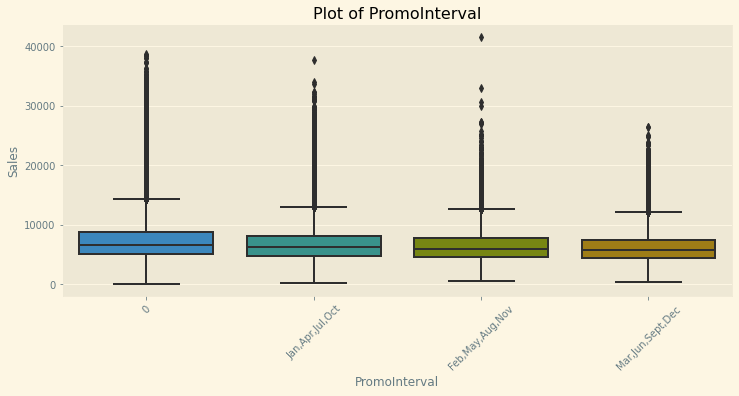

In [33]:
# checking categorical variables using boxplot:

def box_viz(df, col):
    for c in col:
        plt.figure(figsize=[12,5])
        plt.style.use('Solarize_Light2')
        sns.boxplot(data = df, y='Sales', x=c)
        plt.title(f'Plot of {c}')
        plt.xticks(rotation=45)
        plt.show()

box_viz(rossmann, cat_cols)

By plotting Histograms, we have concluded that our dataset contains many outliers which have to be dealt before modelling.

**Bivariate Analysis**


<Figure size 720x576 with 0 Axes>

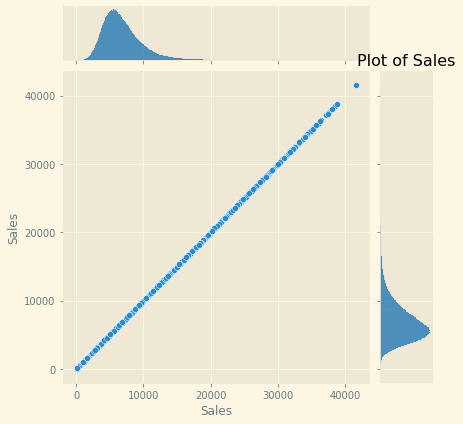

<Figure size 720x576 with 0 Axes>

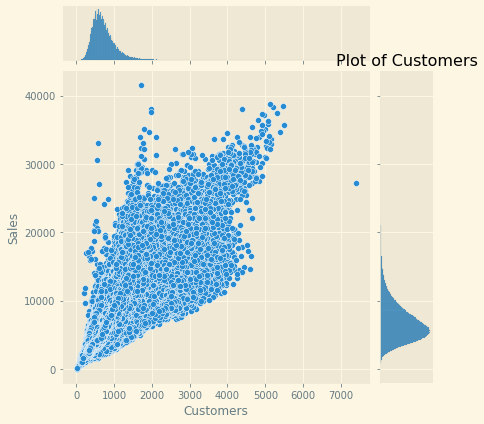

<Figure size 720x576 with 0 Axes>

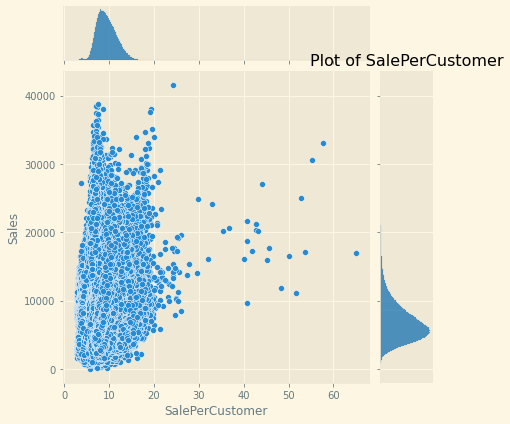

<Figure size 720x576 with 0 Axes>

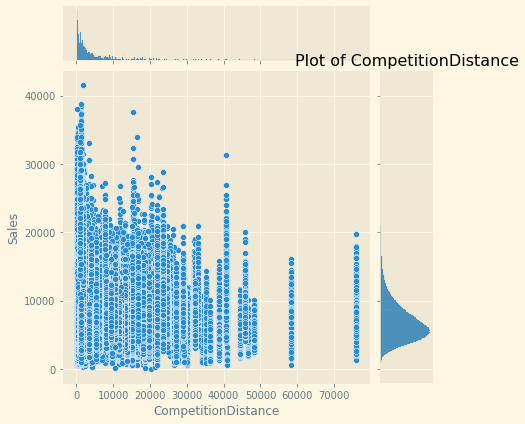

In [34]:
#defining a function to compute the jointplot of numerical columns and target variable

def num_viz(df, col):
    for c in col:
        plt.figure(figsize=(10,8))
        plt.style.use('Solarize_Light2')
        sns.jointplot(data = df, x=c, y='Sales')
        plt.title(f'Plot of {c}')
        plt.show()

num_viz(rossmann, num_cols)

Inference:

Clearly we can observe some relationship exist between Sales and Customers, as well as between Sales and SalePerCustomer


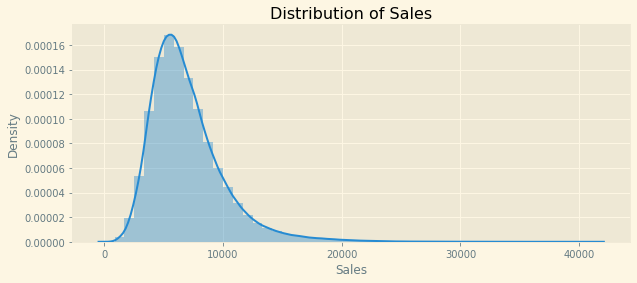

Skewness: 1.594929
Kurtosis: 4.854027


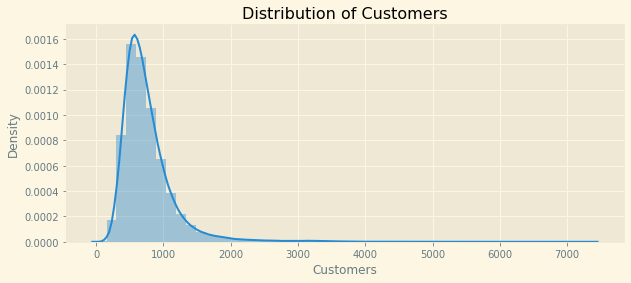

Skewness: 2.789062
Kurtosis: 13.318060


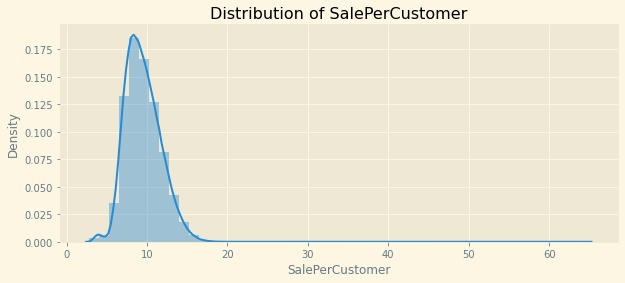

Skewness: 0.592359
Kurtosis: 2.759037


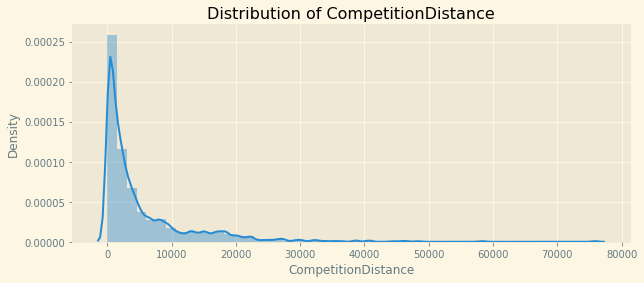

Skewness: 2.980025
Kurtosis: 13.454346


In [35]:
#defining a function to compute the distribution of numerical columns to understand the skewness and kurtosis

def dist_num(df, col):
    plt.figure(figsize=(10,4))
    plt.style.use('Solarize_Light2')
    
    sns.distplot(df[col])
    plt.title(f'Distribution of {col}')
    plt.show()
    print("Skewness: %f" % rossmann[col].skew())
    print("Kurtosis: %f" % rossmann[col].kurt())
    
for c in num_cols:
    dist_num(rossmann, c)

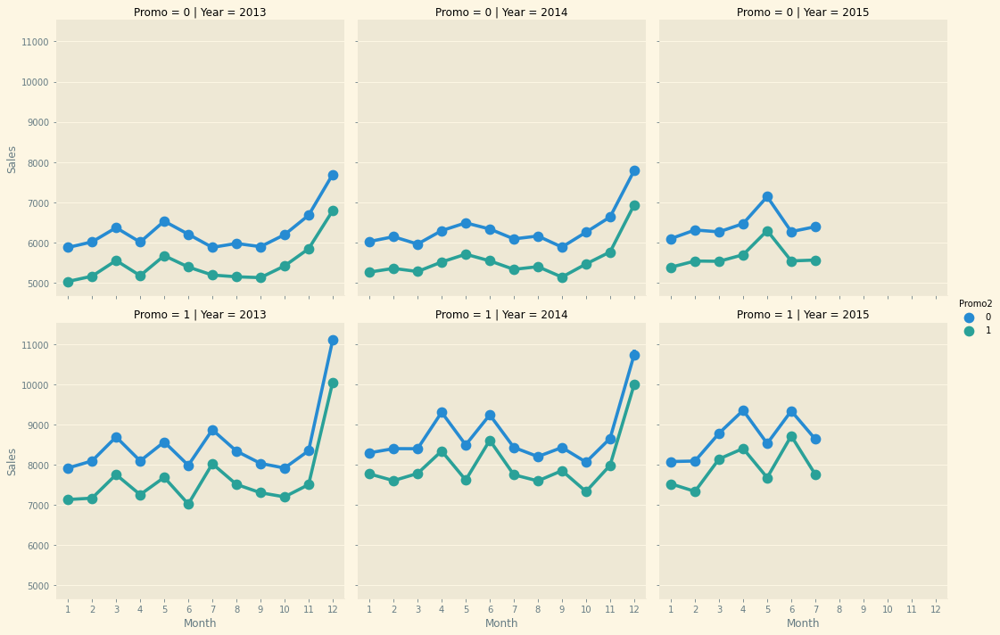

In [36]:
# Sales trend over the months
sns.factorplot(data = rossmann, x ="Month",
               y = "Sales",row = 'Promo',hue = 'Promo2',col = "Year")
plt.show()

Inference:

We can see from the above trends that sales tend to spike in November and December. So, there is a seasonality factor present in the data.


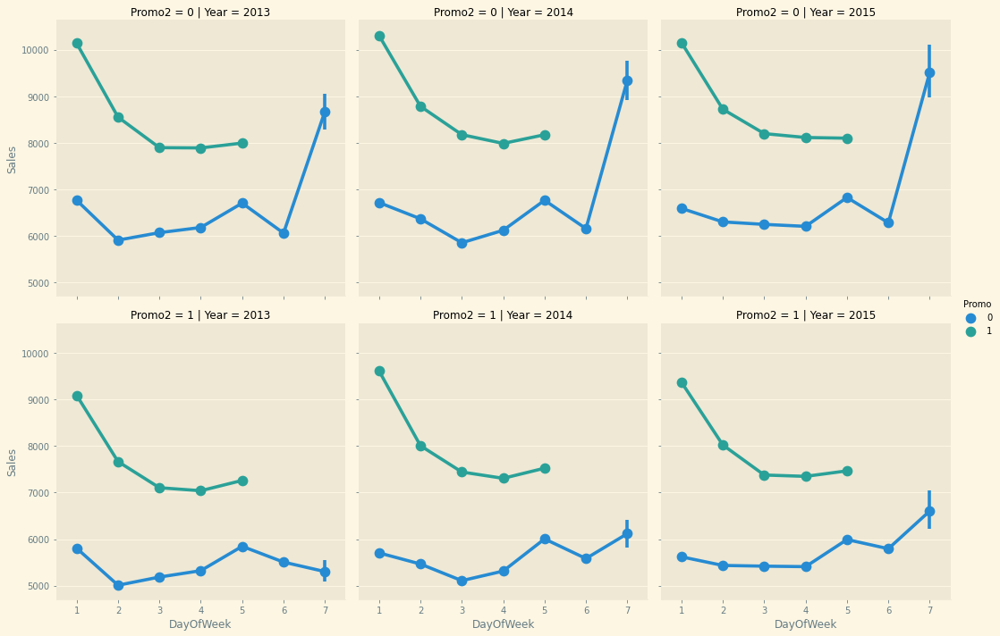

In [37]:
# Sales trend over days
sns.factorplot(data = rossmann, x ="DayOfWeek",
               y = "Sales",hue = 'Promo',row = "Promo2", col = "Year")
plt.show()

Inference:

*   When Promo is applicable, Sales have shown a downside trend towards the end of the week.


*   Also, for stores where promo is not applicable, the sales have highest values on Sundays.



*   Most stores have applied Promos only during the weekdays, and hardly any Promo is applicable on Sundays as the stores want to generate max revenue during saturday-sunday when families come to buy their household necessicities



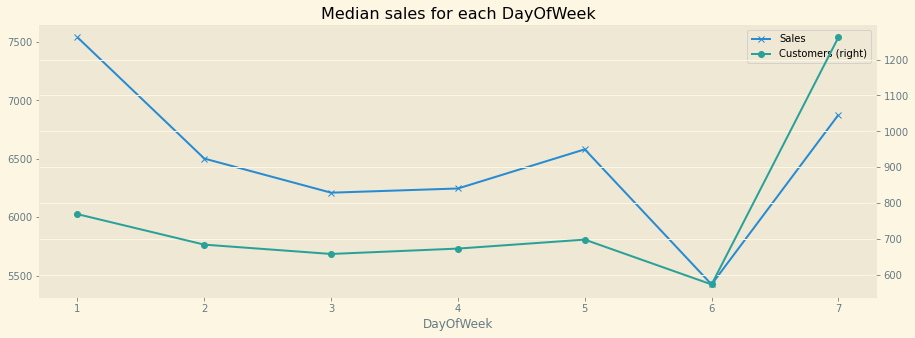

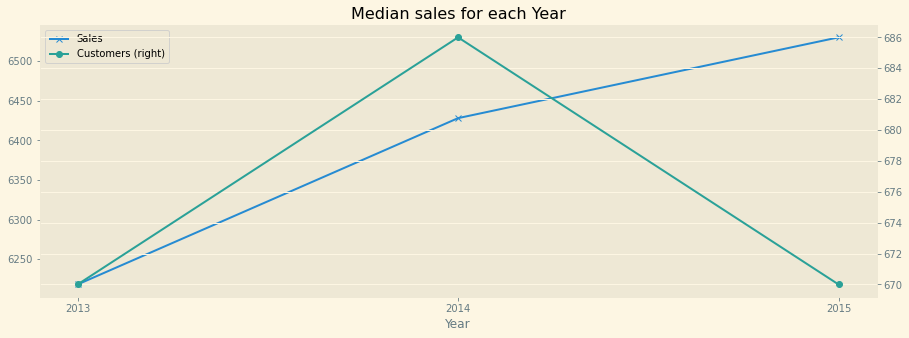

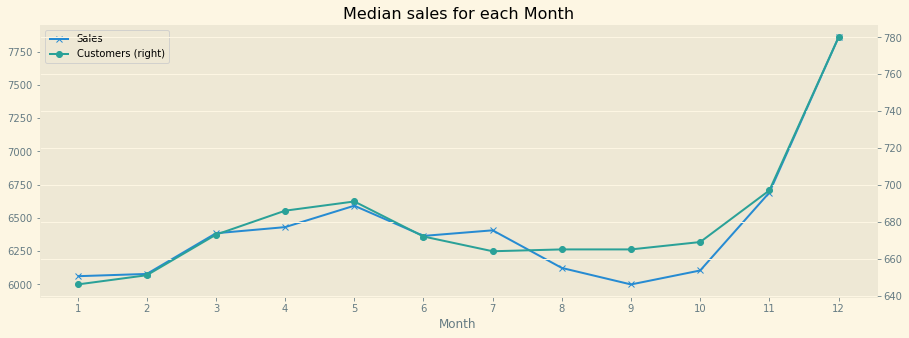

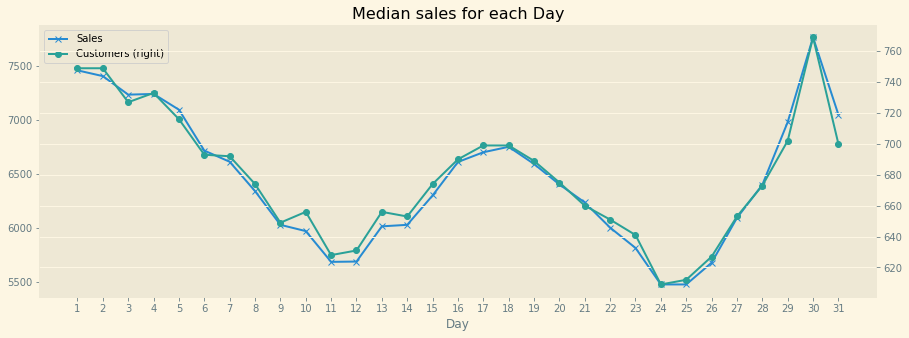

In [38]:
#timeline view of medians of sales of each day of the week
def median_sales_plot(df,list1):
    for c in list1:
        sales_df = df.groupby(c)['Sales'].median()
        cust_df = df.groupby(c)['Customers'].median()

        fig, axis1 = plt.subplots(1,1, sharex=True, figsize=(15,5))
        # plot median sales
        ax1 = sales_df.plot(legend=True, ax=axis1, marker='x', title="Median sales for each "+c)
        ax1.set_xticks(sales_df.index)
        tmp = ax1.set_xticklabels(sales_df.index.tolist(), rotation=90)
        # overlay customer data
        cust_df.plot(legend=True, ax=axis1, marker='o', secondary_y=True)
        plt.show()


median_sales_plot(rossmann, date_cols)

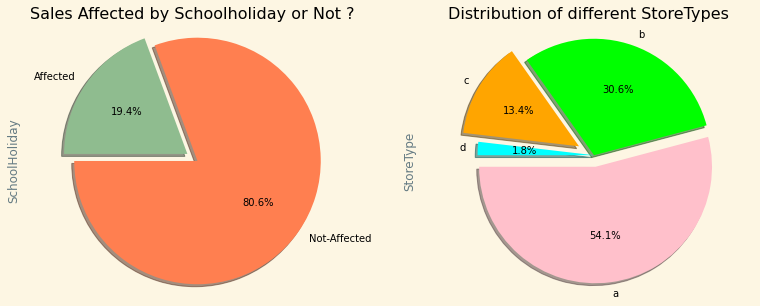

In [39]:
ax1 = plt.subplot(121)
labels = 'Not-Affected' , 'Affected'
sizes = rossmann['SchoolHoliday'].value_counts()
colors = ['coral', 'darkseagreen']
explode = (0.1, 0.0)
rossmann['SchoolHoliday'].value_counts().plot.pie(ax=ax1,title="Sales Affected by Schoolholiday or Not ?", explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=180)
ax1 = plt.axis('equal')
plt.plot()
fig=plt.gcf()
fig.set_size_inches(16,5)

ax2 = plt.subplot(122)
labels = 'a' , 'b' , 'c' , 'd'
colors = ['pink', 'lime' , 'orange' , 'cyan']
explode = (0.1, 0.0 , 0.15 , 0.0)
rossmann['StoreType'].value_counts().plot.pie(ax=ax2, explode=explode, labels=labels, colors=colors,
                                              autopct='%1.1f%%', shadow=True, startangle=180, title="Distribution of different StoreTypes")
ax2 = plt.axis('equal')
plt.plot()
fig=plt.gcf()
fig.set_size_inches(13,5)
plt.show()

Inferences:



*   We can conclude from the first pie-chart that almost 19% of Sales are being affected by SchoolHoliday

*   From the right-side pie-chart we can also conclude that almost half of our Stores are of StoreType A



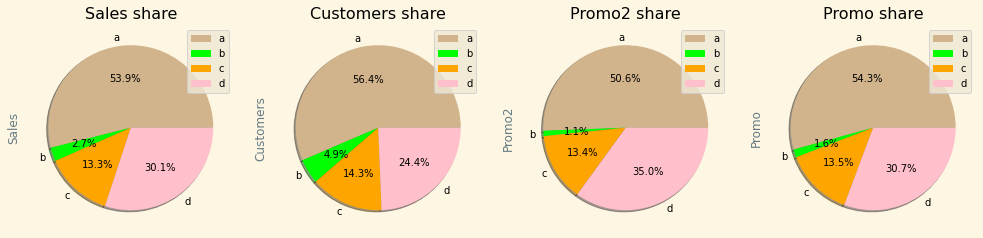

In [40]:
def storetype_pie(df,col):
    for x,y in enumerate(col):
        plt.subplot(1,4,x+1)
        colors = ['tan', 'lime' , 'orange' , 'pink']
        df.groupby('StoreType')[y].sum().plot.pie(title=y+' share', colors=colors,legend=True, autopct='%1.1f%%', shadow=True)
    plt.plot()
    fig=plt.gcf()
    fig.set_size_inches(17,5)
    plt.show()
storetype_pie(rossmann,['Sales','Customers','Promo2','Promo'])

Inference:



*   a & c have similar per store per customer sales figures. Simply put every store has 1 customer for a unit of sale.


*   b looked good intially with the highest average sales but has 3 customers for 2 units of sale. The good thing about this store type is that per store revenue generation(almost 2X) is the most than any other type.



*   d looks like they could use more promotion to get more customers as they have 1 customer for 1.2 units of sale which is good value.





In [41]:
def bivariateplot(x , y):
    fig, axes = plt.subplots(3,1)
    fig.set_size_inches(12, 15)
    plt.style.use('ggplot')
    sns.barplot(x=x, y=y, data=rossmann ,hue="StoreType", ax = axes[0])
    sns.boxplot(x=x, y=y, data=rossmann ,hue="StoreType", ax=axes[1])
    sns.violinplot(x=x, y=y, data=rossmann, hue="StoreType" , ax=axes[2])

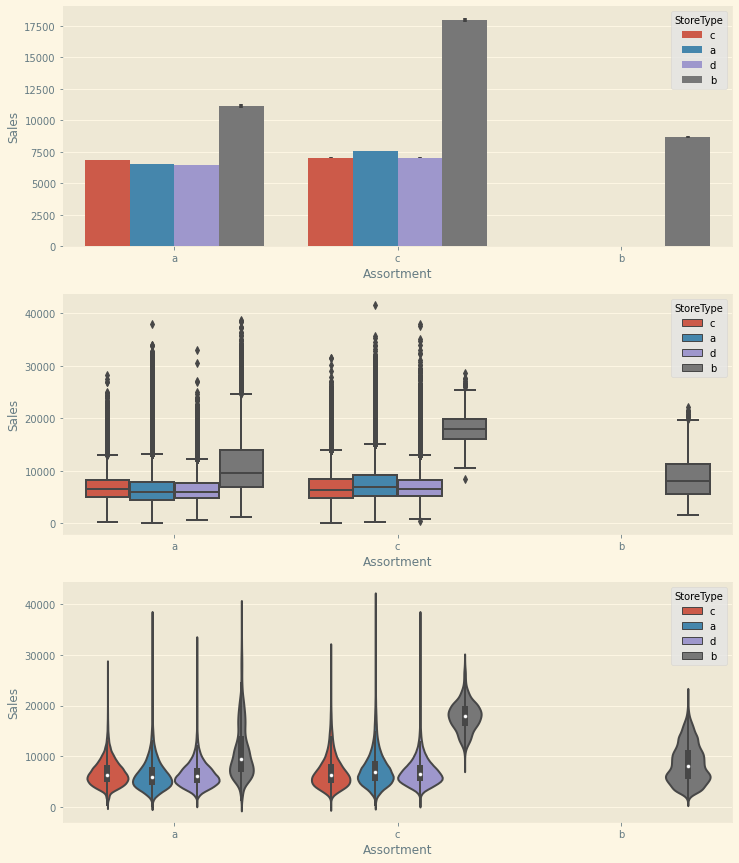

In [42]:
bivariateplot('Assortment','Sales')


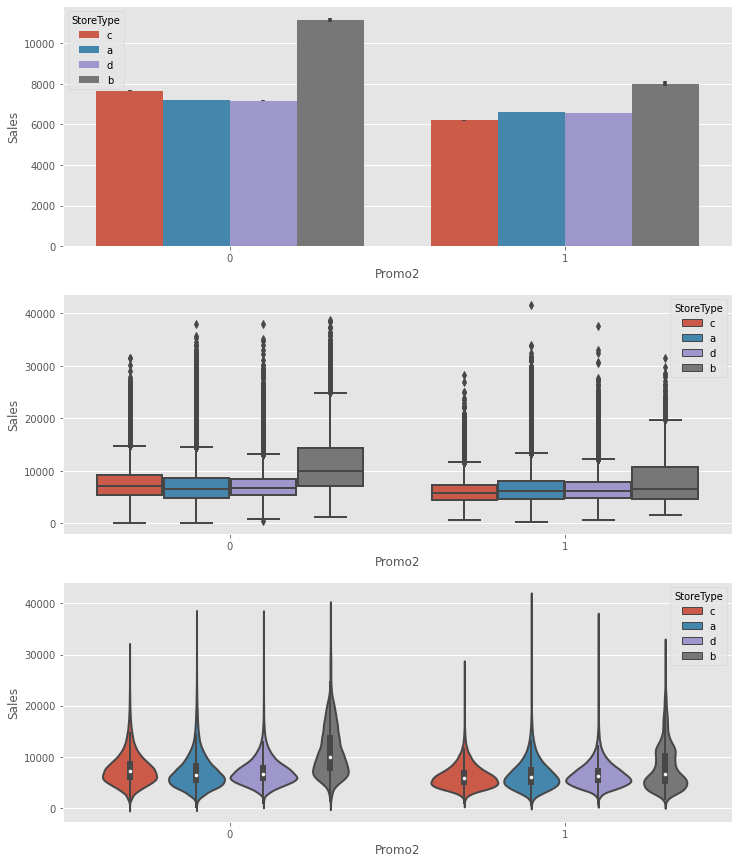

In [43]:
bivariateplot('Promo2','Sales')


Inference: 

We can observe that when Promo2 was not active, StoreType B performed the best giving highest sales.



**Correlation Heatmap**


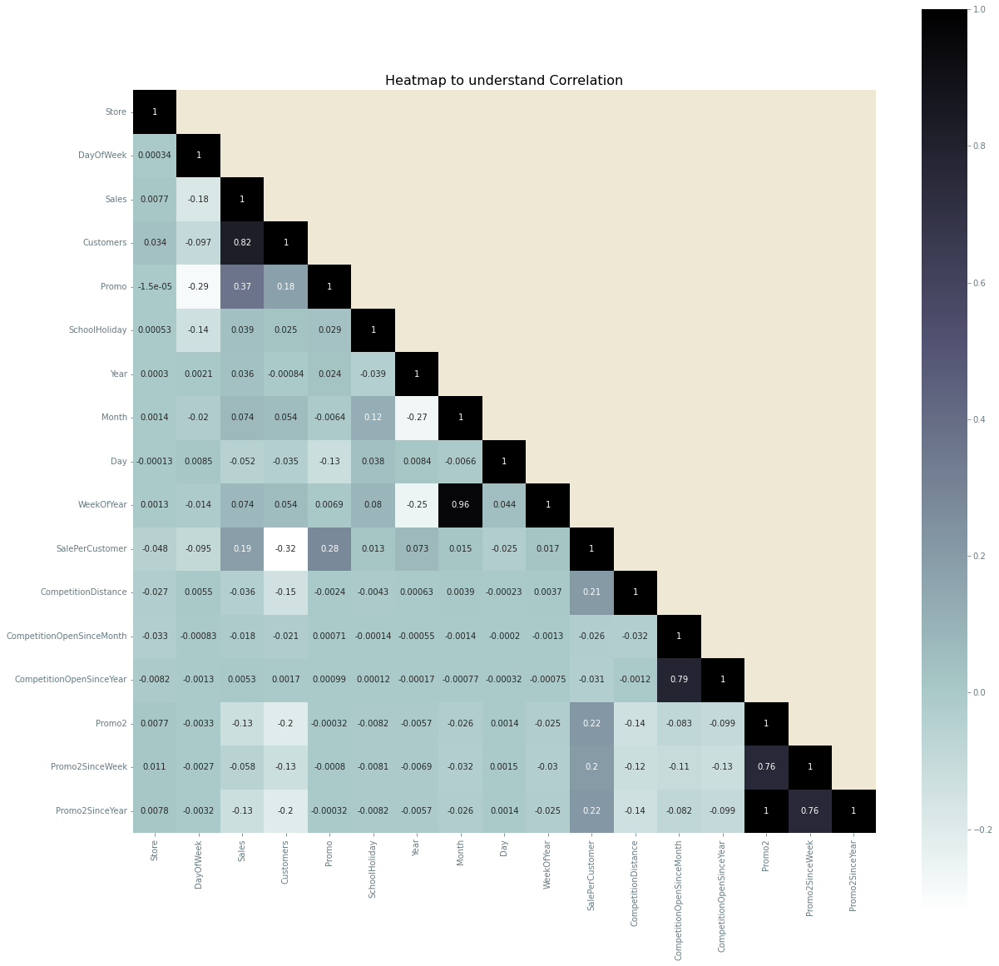

In [44]:
plt.figure(figsize = (20, 20))
plt.style.use('Solarize_Light2')
correlation_map = rossmann[rossmann.columns].corr()
obj = np.array(correlation_map)
obj[np.tril_indices_from(obj)] = False
sns.heatmap(rossmann.corr(), mask= obj,annot = True, square=True, cmap = 'bone_r')
plt.title('Heatmap to understand Correlation')
plt.show()

Inference:



*  We can clearly see, there's a high positive correlation between Customers visiting the stores and Sales

*   WeekOfYear and Month columns also have a high positive correlation which is understandable as both have been derived from Date column.


*  The columns Promo2 and Promo2SinceWeek have a positive correlation of almost 0.76.

*   CompetitionOpenSinceYear and CompetitionOpenSinceMonth also has a high positive correlation of almost 0.8.






**Data Preparation**


In [45]:
# Setting Date as index

rossmann.set_index('Date', inplace=True)

In [46]:
rossmann.head()


,Store,DayOfWeek,Sales,Customers,Promo,StateHoliday,SchoolHoliday,Year,Month,Day,...,SalePerCustomer,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
Date,,,,,,,,,,,,,,,,,,,,,
2015-07-31,1,5,5263,555,1,O,1,2015,7,31,...,9.482883,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
2015-07-30,1,4,5020,546,1,O,1,2015,7,30,...,9.194139,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
2015-07-29,1,3,4782,523,1,O,1,2015,7,29,...,9.143403,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
2015-07-28,1,2,5011,560,1,O,1,2015,7,28,...,8.948214,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
2015-07-27,1,1,6102,612,1,O,1,2015,7,27,...,9.970588,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0


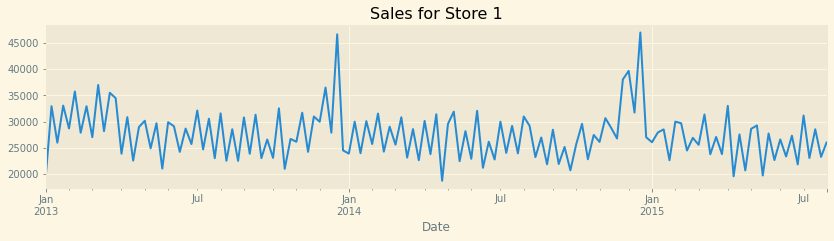

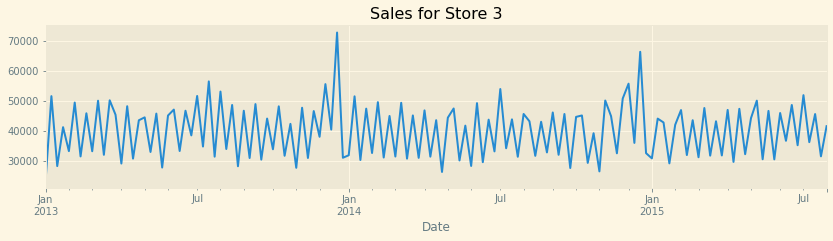

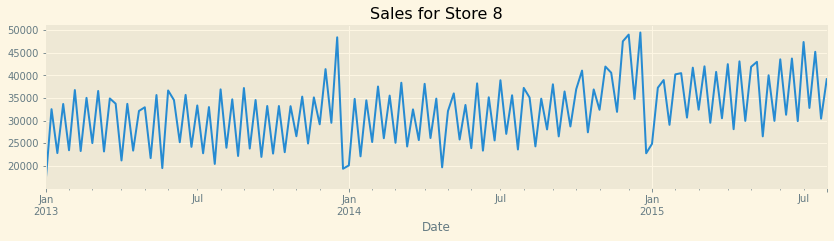

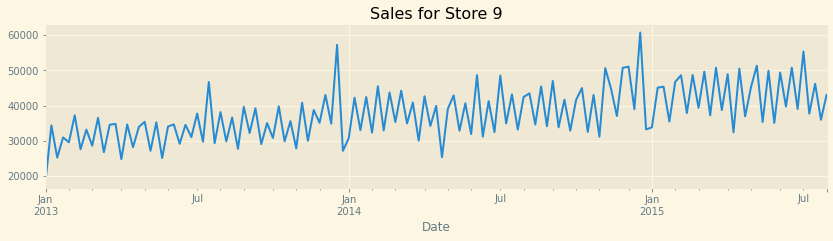

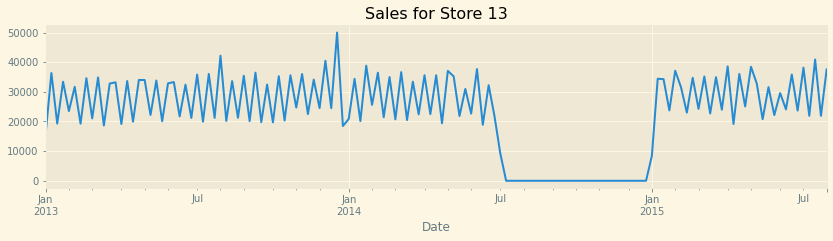

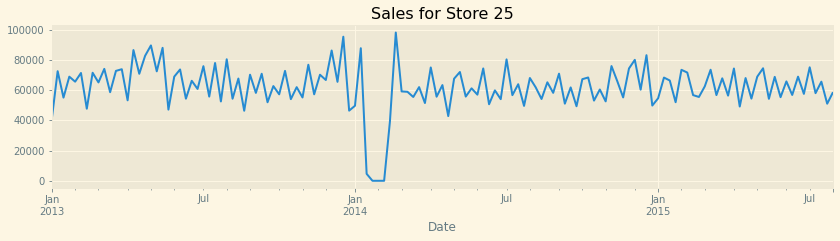

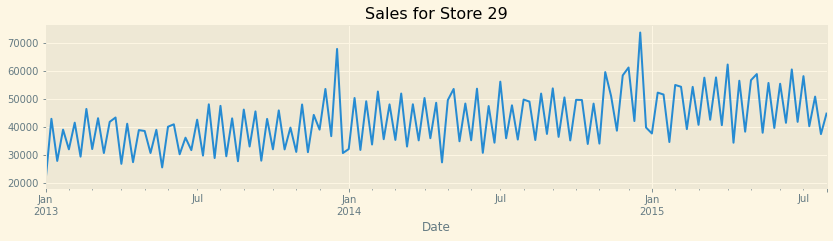

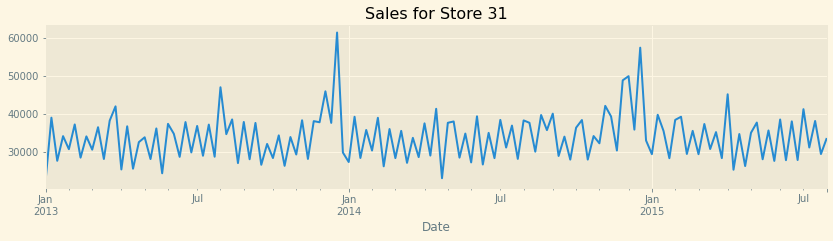

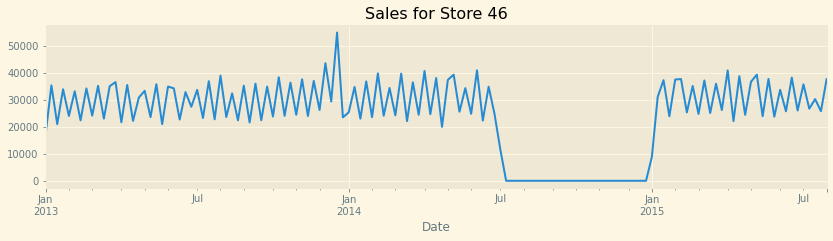

In [47]:
# Data Preparation: input should be float type
rossmann['Sales'] = rossmann['Sales'] * 1.0

# Assigning one store from each category
store1 = rossmann[rossmann.Store == 1]
store3 = rossmann[rossmann.Store == 3] 
store8 = rossmann[rossmann.Store == 8]
store9 = rossmann[rossmann.Store == 9]
store13 = rossmann[rossmann.Store == 13]
store25 = rossmann[rossmann.Store == 25]
store29 = rossmann[rossmann.Store == 29]
store31 = rossmann[rossmann.Store == 31]
store46 = rossmann[rossmann.Store == 46]

# Trend in Sales for all 9 Stores

store_all = {1:store1,3:store3,8:store8,9:store9,13:store13,25:store25,29:store29,31:store31,46:store46}
labels = [1,3,8,9,13,25,29,31,46]

for x,y in store_all.items():
    plt.figure(figsize=(14,3))
    y['Sales'].resample('W').sum().plot()
    plt.title('Sales for Store '+str(x))
    plt.show()


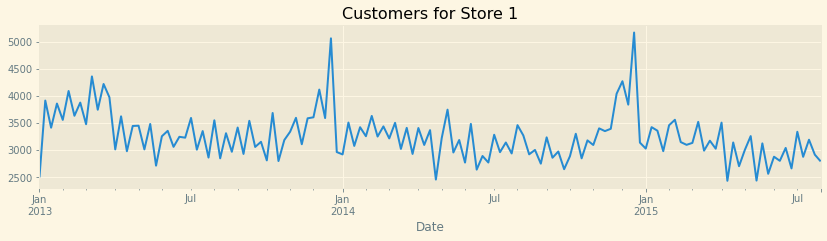

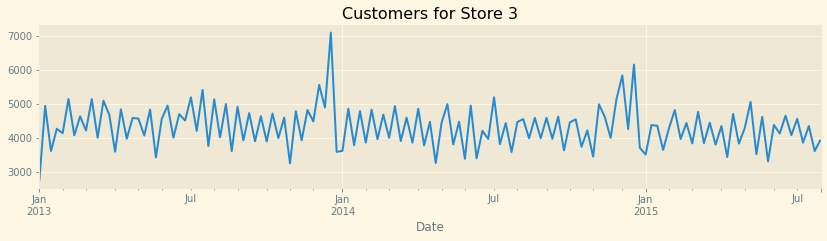

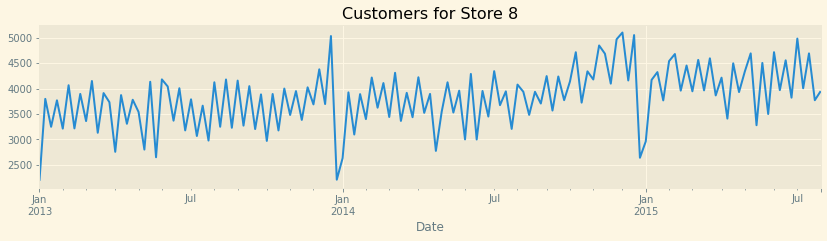

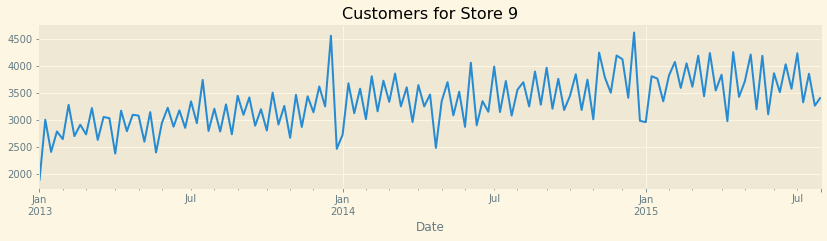

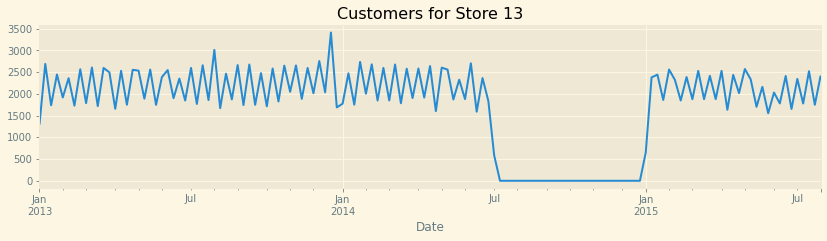

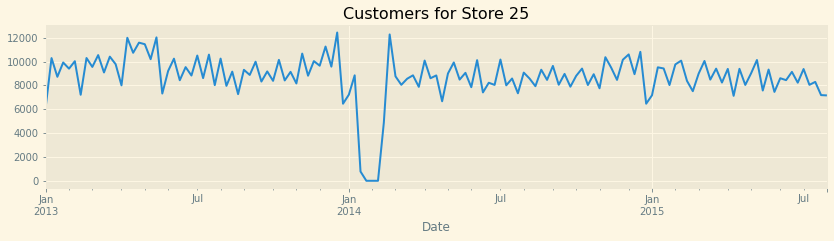

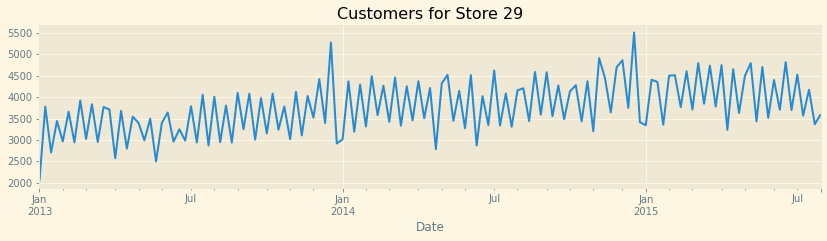

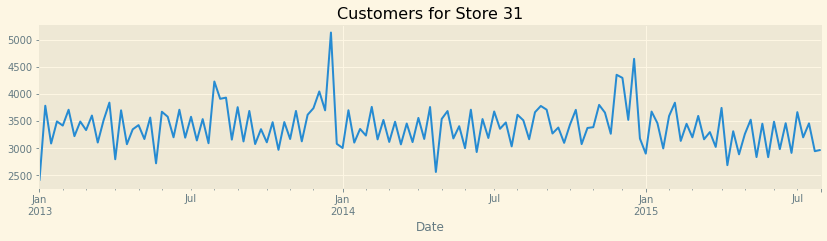

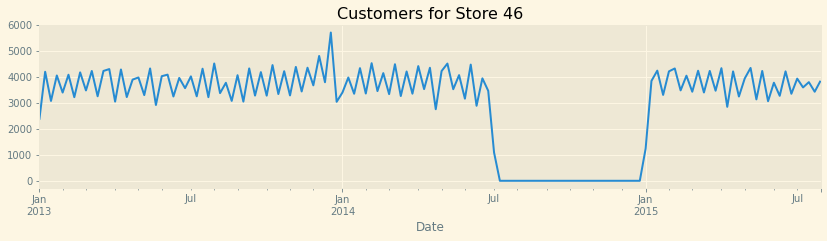

In [48]:
# Trend in Customers for all 9 stores
for x,y in store_all.items():
    plt.figure(figsize=(14,3))
    y['Customers'].resample('W').sum().plot()
    plt.title('Customers for Store '+str(x))
    plt.show()

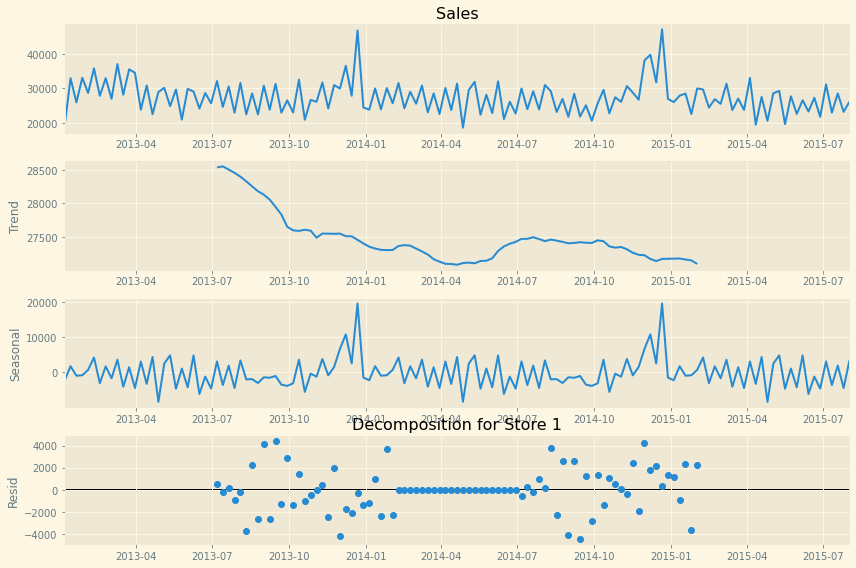

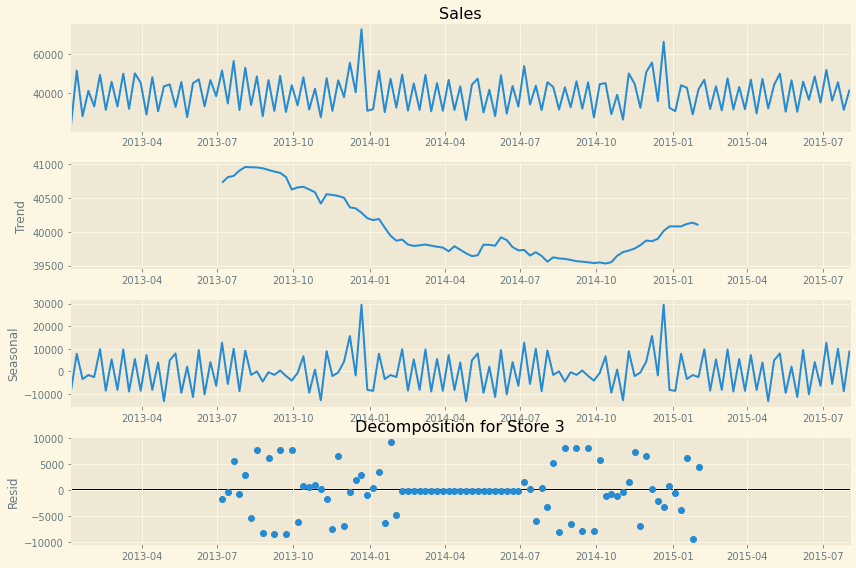

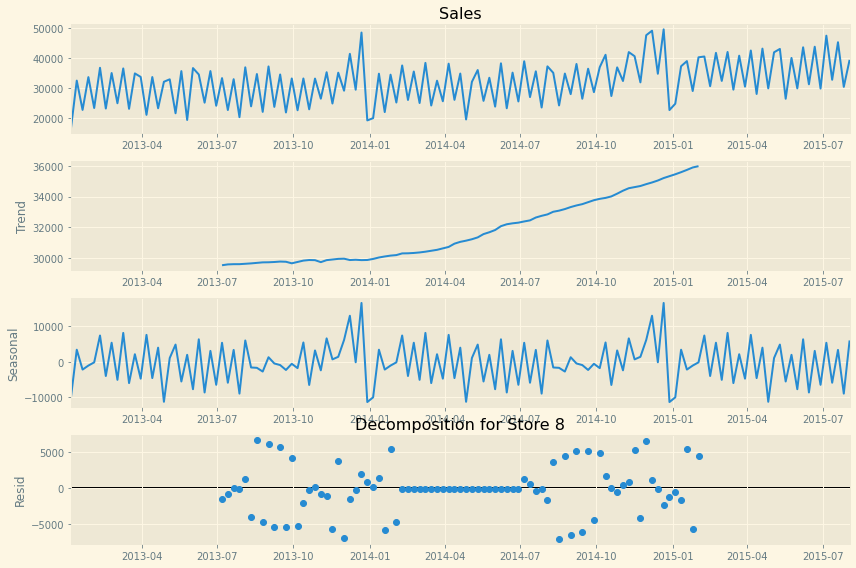

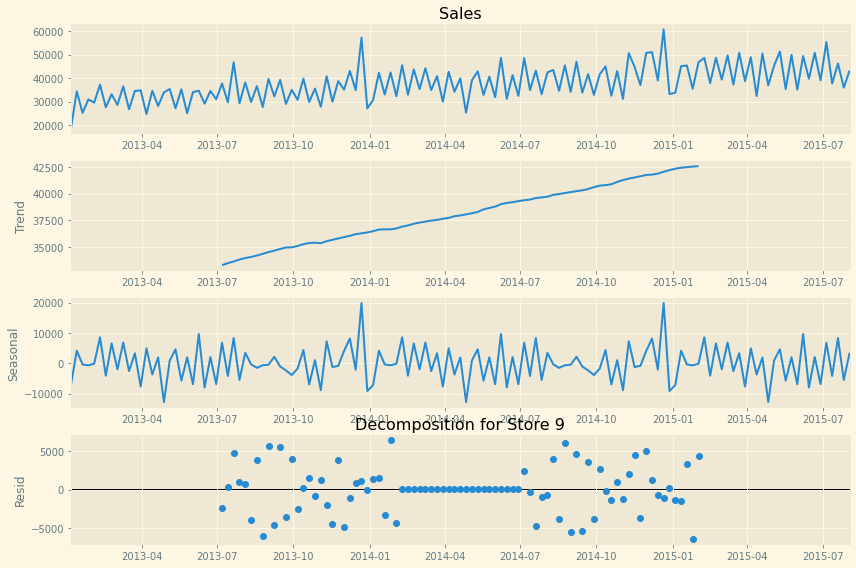

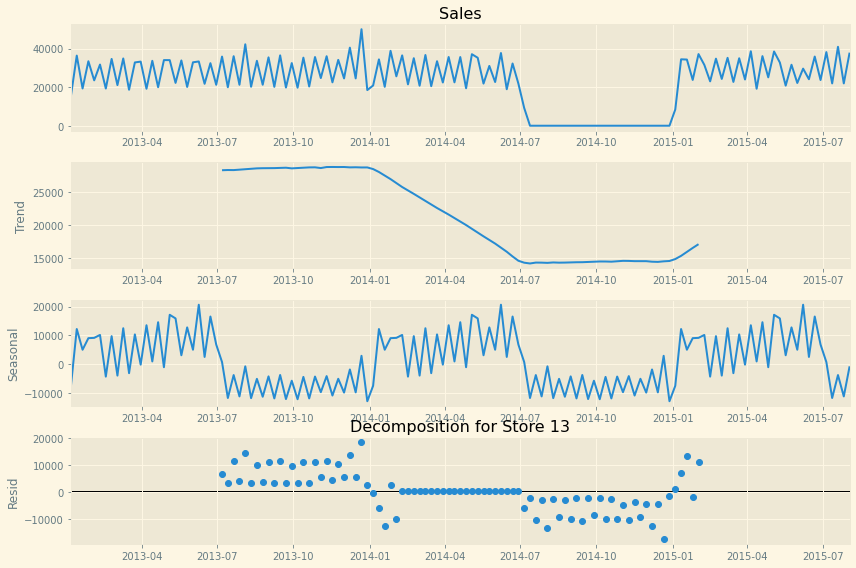

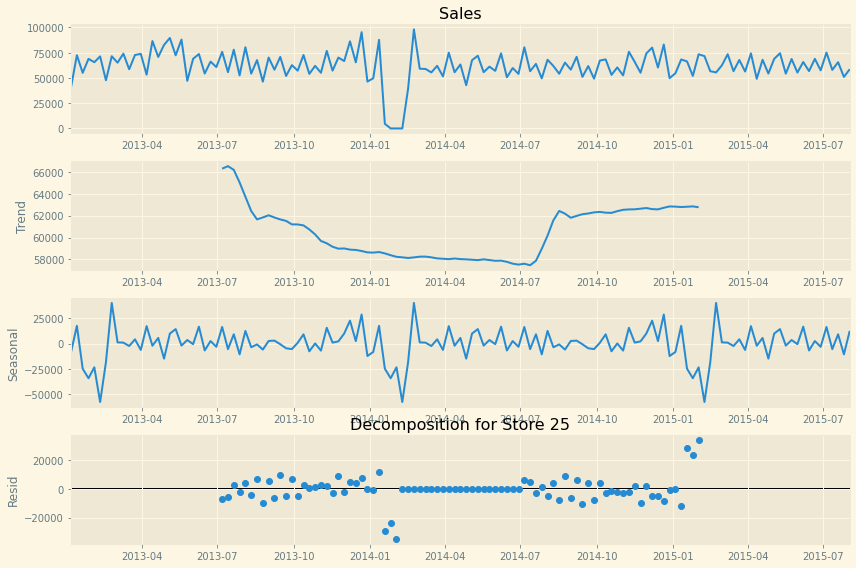

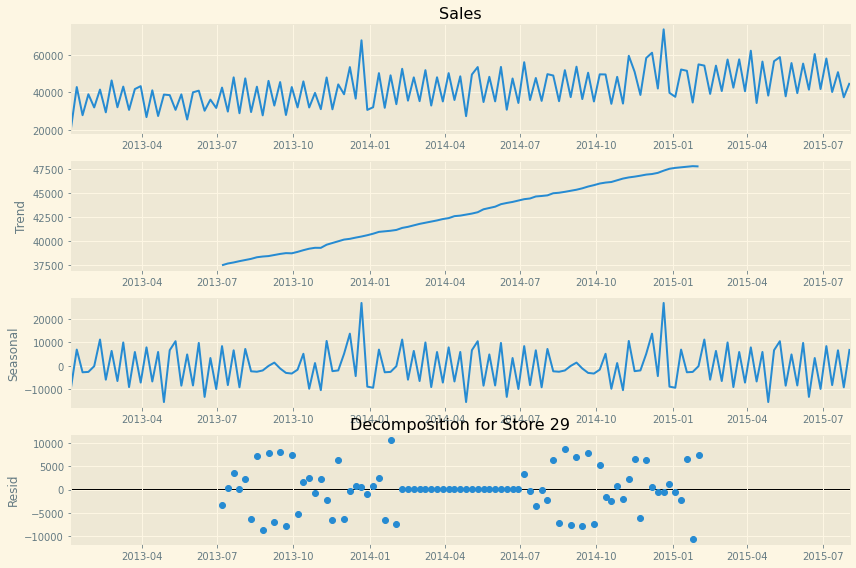

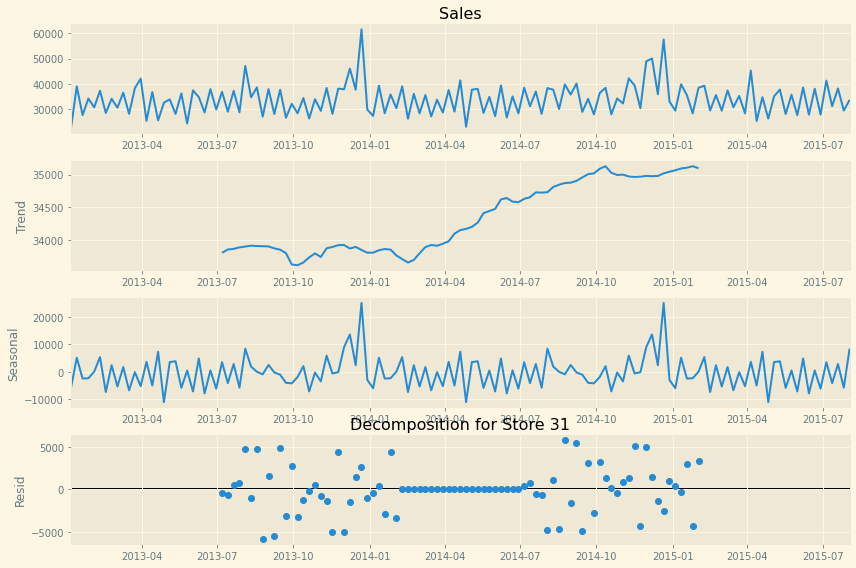

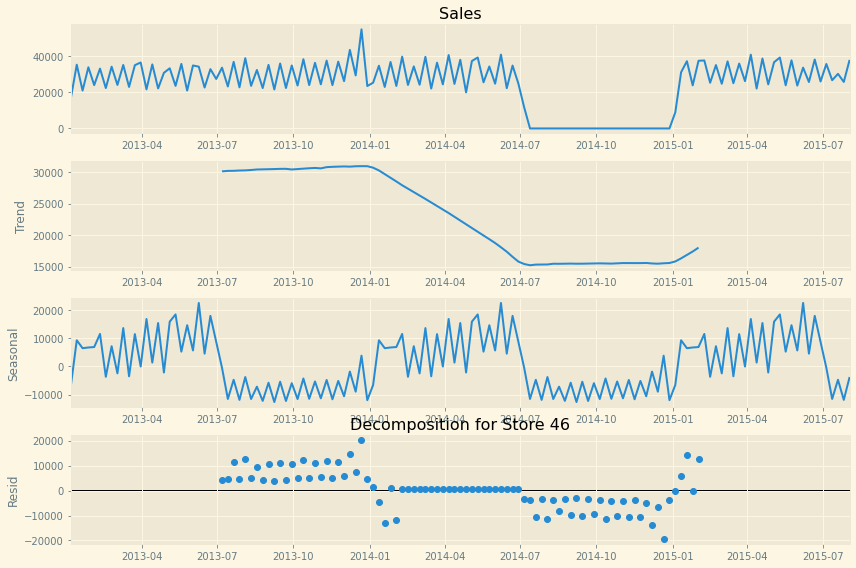

In [49]:
## Additive Seasonal Decomposition:

from pylab import rcParams
import statsmodels.api as sm

for x,y in store_all.items():
    rcParams['figure.figsize'] = 12, 8
    decomposition = sm.tsa.seasonal_decompose(y['Sales'].resample('W').sum(), model='additive') # additive seasonal index
    fig = decomposition.plot()
    plt.title('Decomposition for Store '+str(x))
    plt.show()

In [50]:
def dates_fill(data):
    idx = pd.date_range(data.index.min(), data.index.max())

    data.index = pd.DatetimeIndex(data.index)
    data = data.reindex(idx, fill_value=np.nan)
    data.index.name = 'Date'
    return data

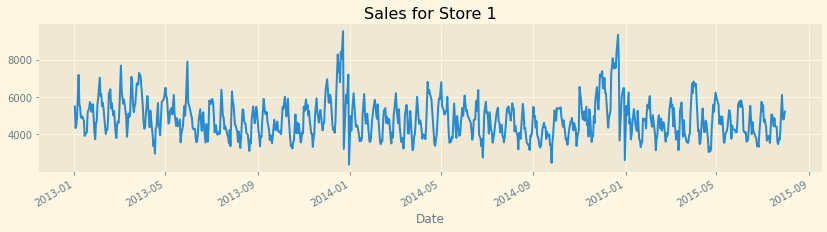

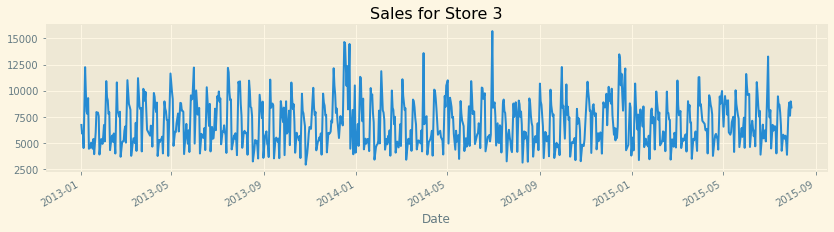

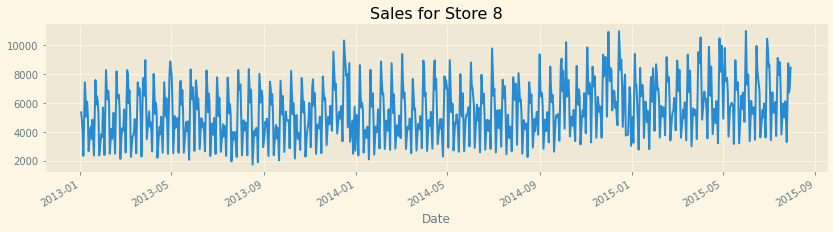

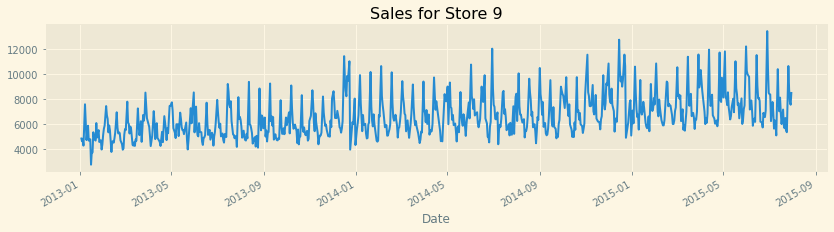

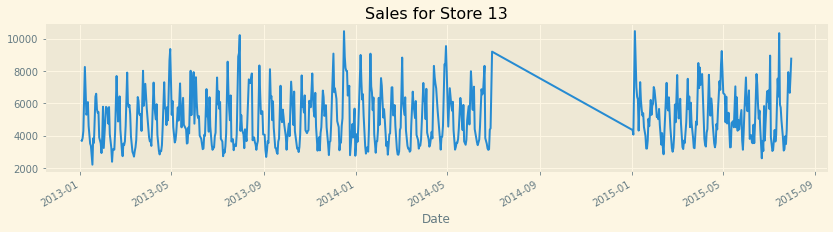

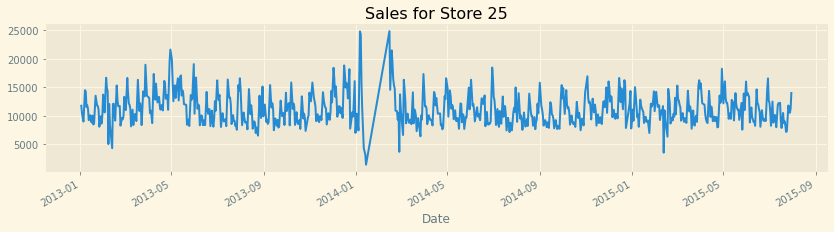

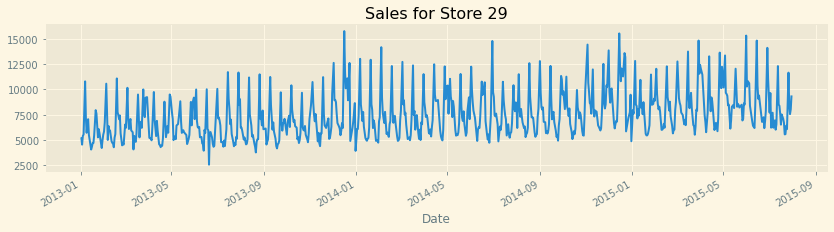

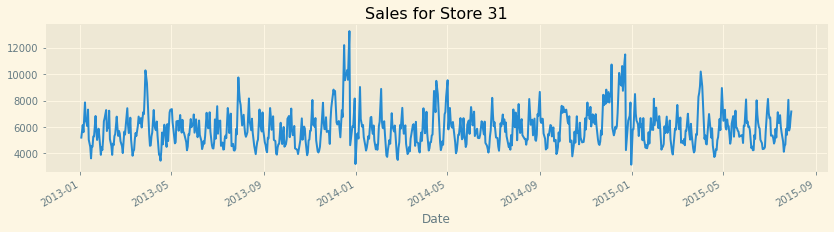

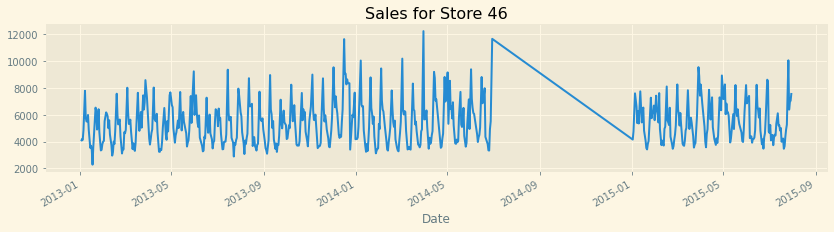

In [51]:
for key,store in store_all.items():
    store_all[key]=dates_fill(store)
    store_all[key]['Sales'].replace("NaN",np.nan,inplace=True)
    store_all[key]['Customers'].replace("NaN",np.nan,inplace=True)
    store_all[key]['SalePerCustomer'].replace("NaN",np.nan,inplace=True)

    store['Sales'].astype(float).plot(y='Sales',figsize = (14,3))
    plt.title('Sales for Store '+str(key))
    
    plt.show(block=False)

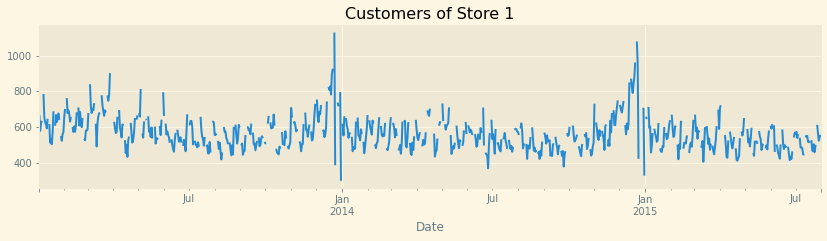

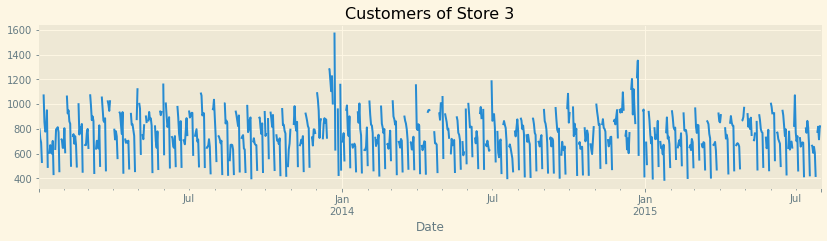

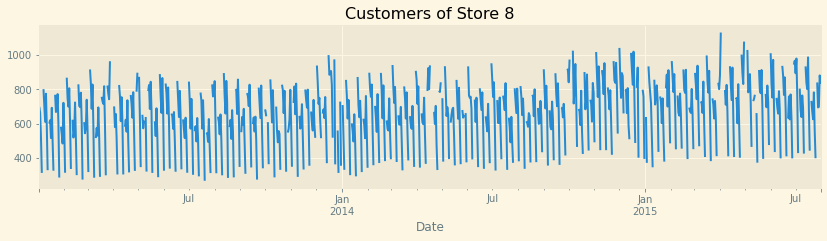

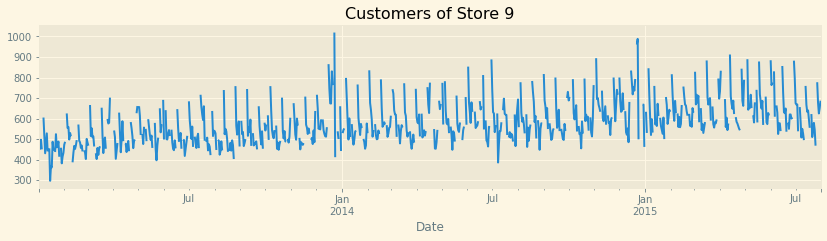

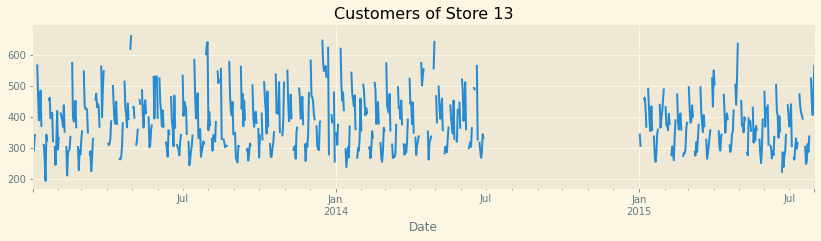

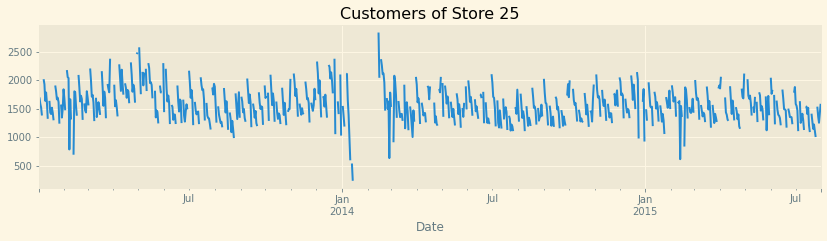

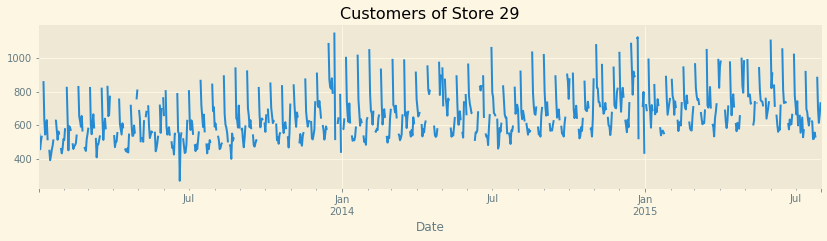

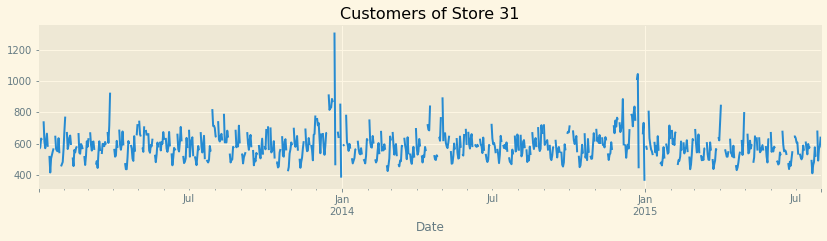

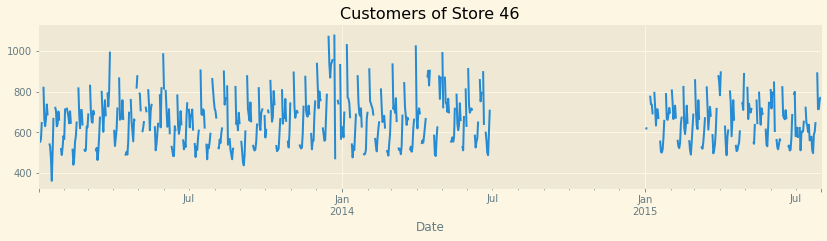

In [52]:
for key,store in store_all.items():
    store['Customers'].astype(float).plot(y='Sales',figsize = (14,3))
    plt.title('Customers of Store '+str(key))
    
    plt.show(block=False)

In [53]:
#impute data with same dates data from last year  

from dateutil.relativedelta import relativedelta

def previous_year(data,startdate,enddate,store,column):
    for index, row in data.iterrows():
        if ((pd.isna(row[column]) and (index.strftime("%Y-%m-%d") > startdate) and (index.strftime("%Y-%m-%d") < enddate))):
            date=pd.to_datetime(index)
            previousYrDate=date- relativedelta(years=1)
            previousYrDate= previousYrDate.strftime("%Y-%m-%d")
            previousYrData=store_all[store][store_all[store].index==previousYrDate][column]
            store_all[store].loc[index.strftime("%Y-%m-%d"), column]=previousYrData.get(previousYrDate)

In [54]:
previous_year(store_all[13],'2014-07-01','2015-01-02',13,'Sales')    
previous_year(store_all[25],'2014-07-01','2015-01-02',25,'Sales')    
previous_year(store_all[46],'2014-07-01','2015-01-02',46,'Sales') 

previous_year(store_all[13],'2014-07-01','2015-01-02',13,'Customers')    
previous_year(store_all[25],'2014-07-01','2015-01-02',25,'Customers')    
previous_year(store_all[46],'2014-07-01','2015-01-02',46,'Customers') 

In [55]:
store_all[13][(store_all[13].index >'2014-07-15') & (store_all[13].index <'2015-01-02')]


,Store,DayOfWeek,Sales,Customers,Promo,StateHoliday,SchoolHoliday,Year,Month,Day,...,SalePerCustomer,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
Date,,,,,,,,,,,,,,,,,,,,,
2014-07-16,NaN,NaN,6724.0,468.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-07-17,NaN,NaN,5647.0,395.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-07-18,NaN,NaN,4957.0,405.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-07-19,NaN,NaN,6487.0,476.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-07-20,NaN,NaN,3636.0,329.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-12-28,NaN,NaN,3886.0,379.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-12-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-12-30,NaN,NaN,5672.0,482.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


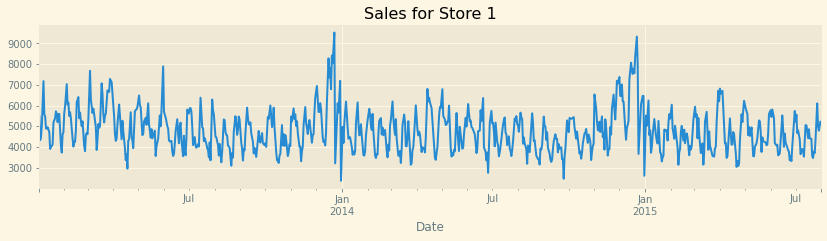

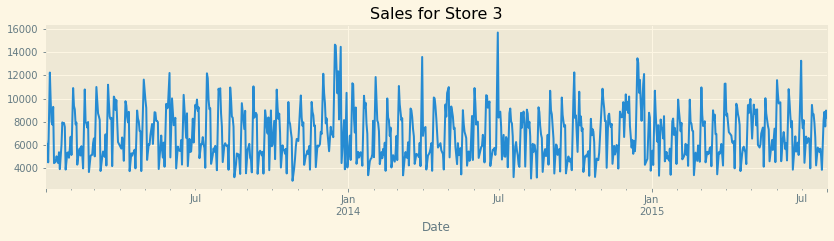

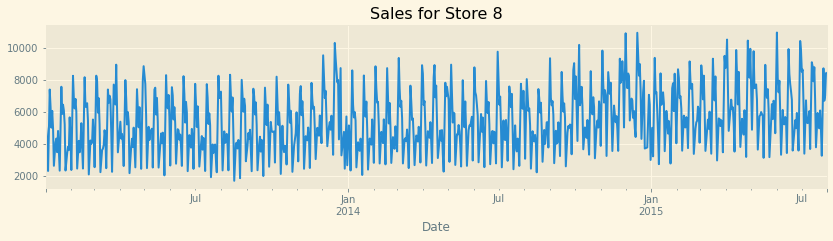

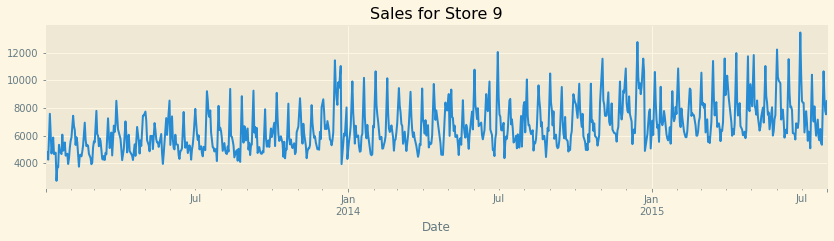

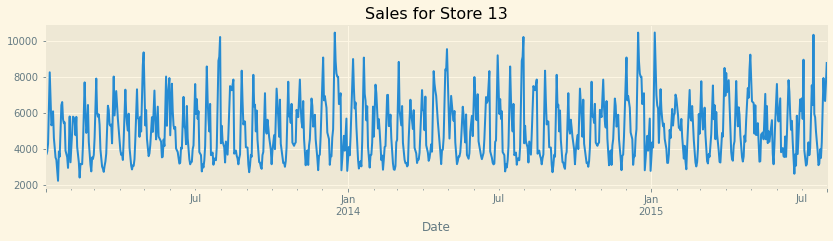

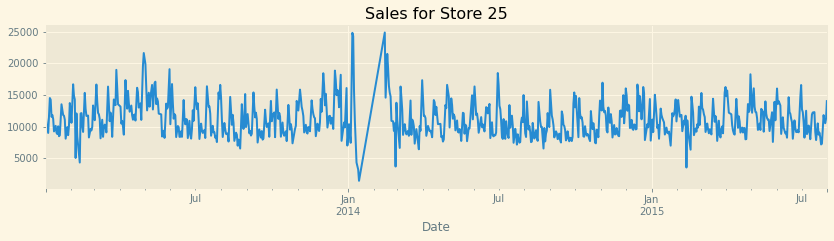

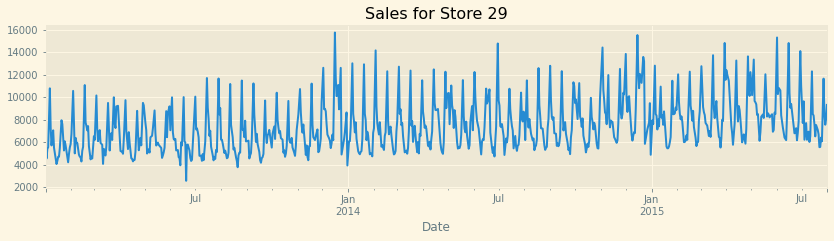

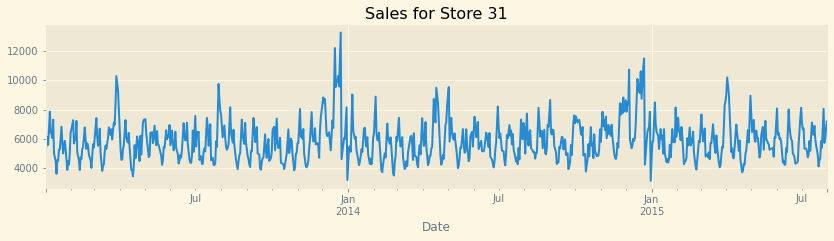

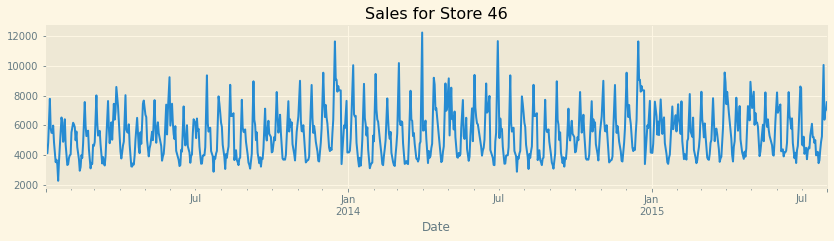

In [56]:
# Linear Interpolation

for key,store in store_all.items():
    store_all[key]=dates_fill(store)
    store_all[key]['Sales'].replace("NaN",np.nan,inplace=True)
    store_all[key]['Sales']=store_all[key]['Sales'].interpolate(method="linear")
    store_all[key]['Customers'].replace("NaN",np.nan,inplace=True)    
    store_all[key]['Customers']=store_all[key]['Customers'].interpolate(method="linear")
    store_all[key]['SalePerCustomer'].replace("NaN",np.nan,inplace=True)    
    store_all[key]['SalePerCustomer']=store_all[key]['Customers'].interpolate(method="linear")
    store_all[key]['Sales'].astype(float).plot(y='Sales',figsize = (14,3),)
    plt.title('Sales for Store '+str(key))
    plt.show(block=False)

In [57]:
store_all[8].columns


Index(['Store', 'DayOfWeek', 'Sales', 'Customers', 'Promo', 'StateHoliday',
       'SchoolHoliday', 'Year', 'Month', 'Day', 'WeekOfYear',
       'SalePerCustomer', 'StoreType', 'Assortment', 'CompetitionDistance',
       'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Promo2',
       'Promo2SinceWeek', 'Promo2SinceYear', 'PromoInterval'],
      dtype='object')

In [58]:
store_all[8].info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 941 entries, 2013-01-02 to 2015-07-31
Freq: D
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Store                      784 non-null    float64
 1   DayOfWeek                  784 non-null    float64
 2   Sales                      941 non-null    float64
 3   Customers                  941 non-null    float64
 4   Promo                      784 non-null    float64
 5   StateHoliday               784 non-null    object 
 6   SchoolHoliday              784 non-null    float64
 7   Year                       784 non-null    float64
 8   Month                      784 non-null    float64
 9   Day                        784 non-null    float64
 10  WeekOfYear                 784 non-null    float64
 11  SalePerCustomer            941 non-null    float64
 12  StoreType                  784 non-null    object 
 13  Assortment             

In [59]:
# handling missing data for other columns after linear interpolation

for key,store in store_all.items():

    store_all[key]['Store'].fillna(key, inplace=True)
    store_all[key]['Promo'].fillna(store_all[key]['Promo'].median(), inplace=True)
    store_all[key]['SchoolHoliday'].fillna(store_all[key]['SchoolHoliday'].median(), inplace=True)

    col_list = ['StoreType','Assortment','Promo2','Promo2SinceWeek','Promo2SinceYear','CompetitionDistance',
                 'CompetitionOpenSinceMonth','CompetitionOpenSinceYear','PromoInterval','StateHoliday']
    for col in col_list:
        store_all[key][col] = store_all[key][col].ffill().bfill() 
    
    store_all[key]['Year'] = store_all[key].index.year
    store_all[key]['Month'] = store_all[key].index.month
    store_all[key]['Day'] = store_all[key].index.day
    store_all[key]['WeekOfYear'] = store_all[key].index.weekofyear
    store_all[key]['DayOfWeek'] = store_all[key].index.dayofweek
    store_all[key]['SalePerCustomer'] =  store_all[key]['Sales']/ store_all[key]['Customers']

**Handling Outliers**


In [60]:
# Removing Outliers:
# Taking the cap of 1% to 99%

for key,store in store_all.items():
    custom_list = ['Sales','Customers','SalePerCustomer']
    for col in custom_list:
        percentiles = store_all[key][col].quantile([0.01,0.99]).values
        store_all[key][col][store_all[key][col] <= percentiles[0]] = percentiles[0]
        store_all[key][col][store_all[key][col] >= percentiles[1]] = percentiles[1]

In [61]:
#checking  store 46 where we did major interpolation
print(store_all[46].isnull().sum())

Store                        0
DayOfWeek                    0
Sales                        0
Customers                    0
Promo                        0
StateHoliday                 0
SchoolHoliday                0
Year                         0
Month                        0
Day                          0
WeekOfYear                   0
SalePerCustomer              0
StoreType                    0
Assortment                   0
CompetitionDistance          0
CompetitionOpenSinceMonth    0
CompetitionOpenSinceYear     0
Promo2                       0
Promo2SinceWeek              0
Promo2SinceYear              0
PromoInterval                0
dtype: int64


There are no more null values present



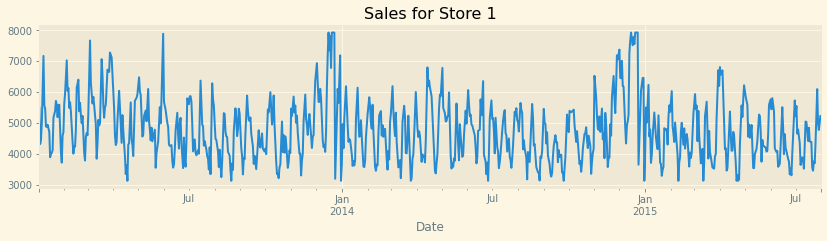

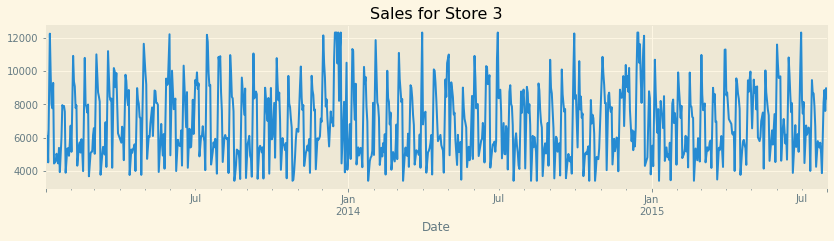

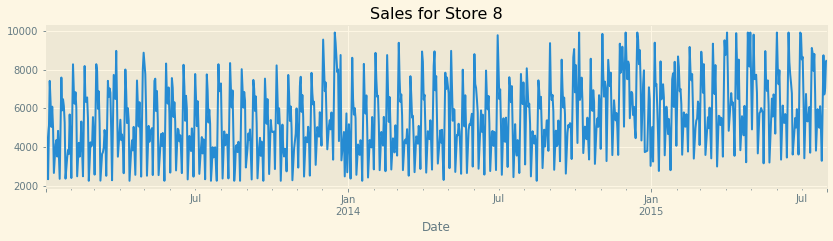

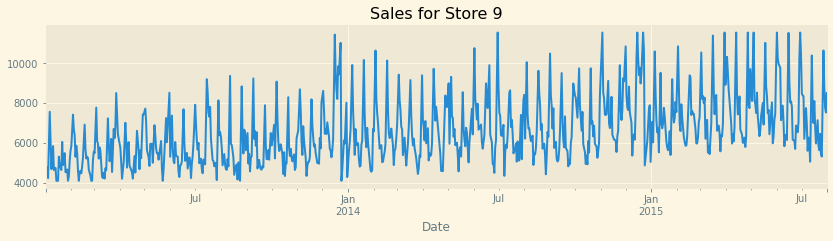

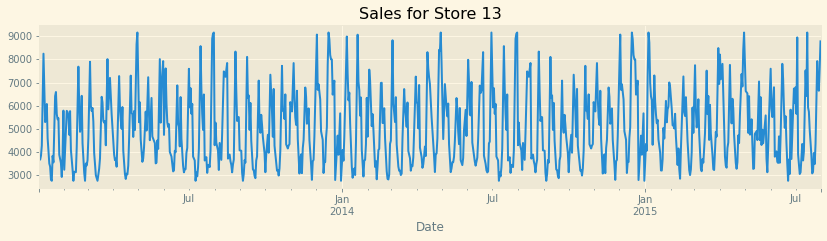

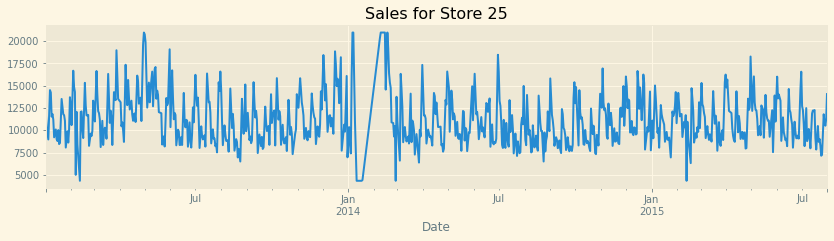

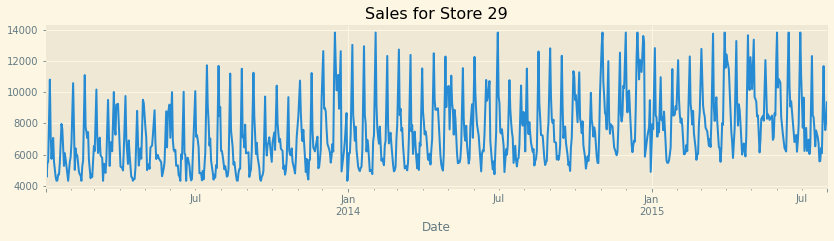

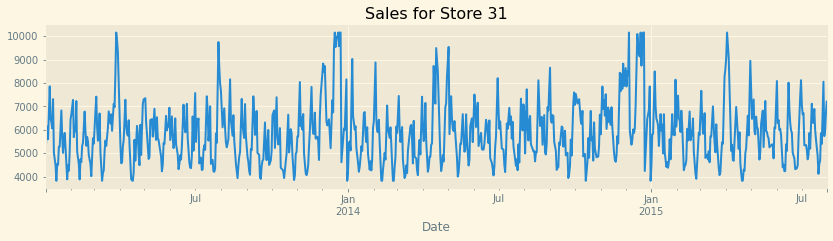

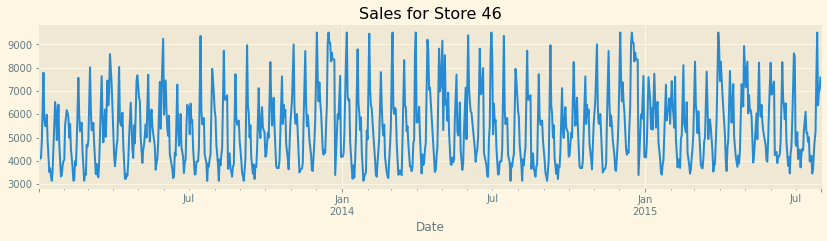

In [62]:
# checking Sales for all stores:
for key,store in store_all.items():
    store['Sales'].astype(float).plot(y='Sales',figsize = (14,3),)
    plt.title('Sales for Store '+str(key))
    plt.show()

After plotting the Sales for each store, from above can conclude that, our data for each store is now ready for train-test split.


**Train-Test Split**


In [63]:
# getting the train lenght and test lenght
train_len = int((store_all[1].resample('W').sum().shape[0])-7)

# creating a new dictionary for train-test
traintest = {}

for key,store in store_all.items(): 
    # resampling the 9 stores data week-wise:
    store = store.resample('W').sum() 
    train = store[:train_len]
    test = store[train_len:-1]
    traintest[key] = {0:train,1:test}
    
# checking our train-test split

print('Shape of Store9 train dataset: ', traintest[9][0].shape)
print('Shape of Store9 test dataset: ',traintest[9][1].shape)

Shape of Store9 train dataset:  (128, 18)
Shape of Store9 test dataset:  (6, 18)


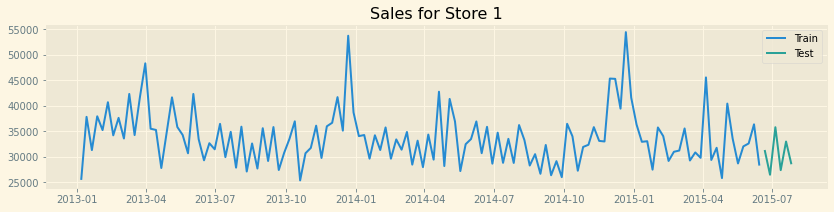

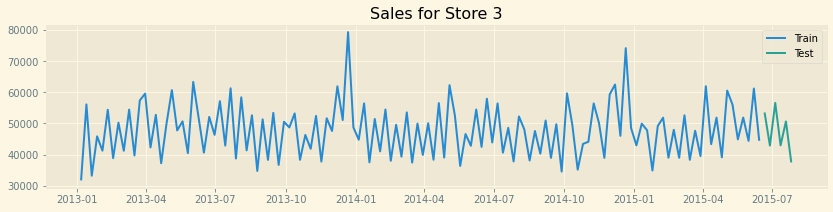

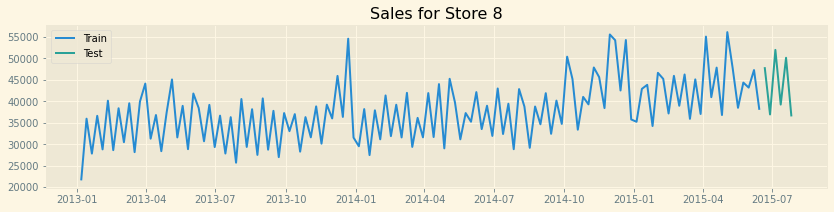

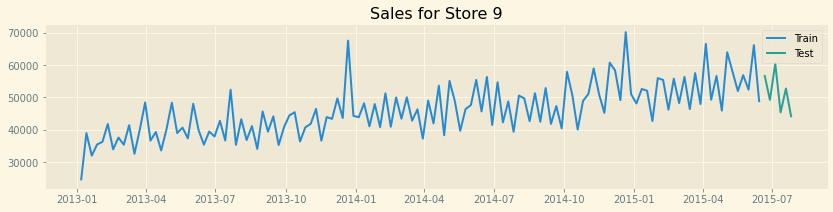

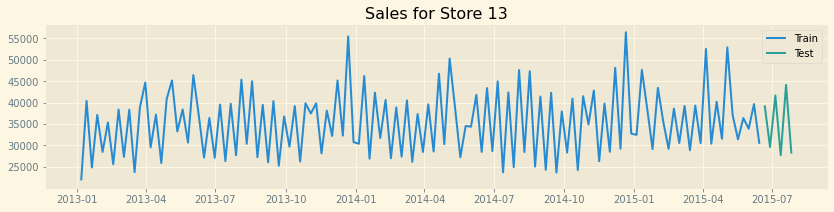

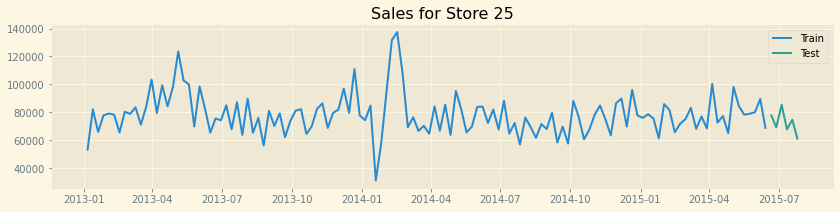

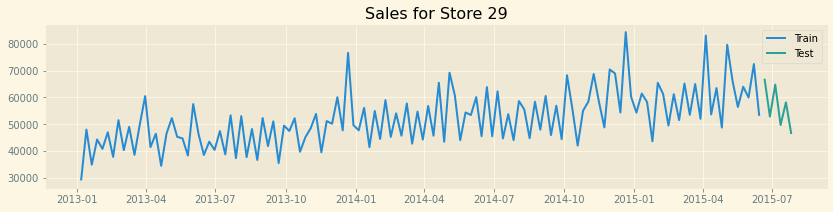

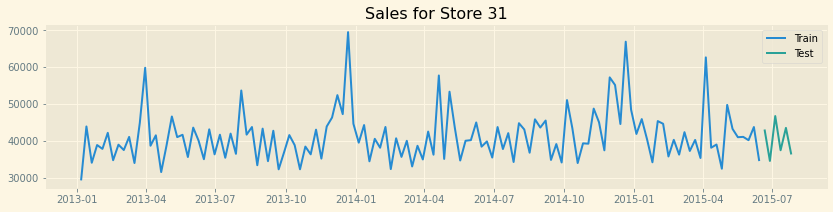

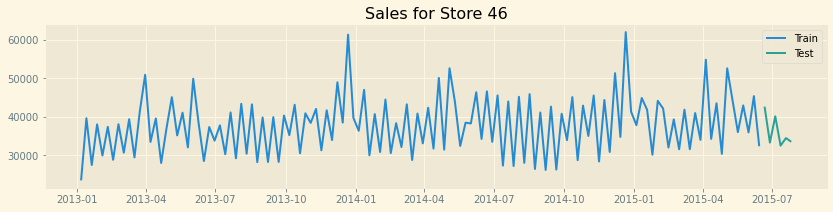

In [64]:
for key,data in traintest.items():
    plt.figure(figsize=(14,3)) 
    plt.plot( traintest[key][0]['Sales'], label='Train')
    plt.plot(traintest[key][1]['Sales'], label='Test')
    plt.title('Sales for Store '+str(key))
    plt.legend(loc='best')
    plt.show()

We can easily observe that our dataset for each store has been divided into train and test, and we can now proceed with Time-Series Modelling


**Time Series Modelling**


Holt-Winter's


In [65]:
holtwinter_df = {}

# function to compute Holt-Winter's forecasting:
def holtwinter(data,x):
    model = ExponentialSmoothing(np.asarray(data[x][0]['Sales']) ,
                                 seasonal_periods=12 ,trend='add', seasonal='add')
    model_fit = model.fit(optimized=True)
    print(model_fit.params)

    hw = data[x][1]['Sales'].copy()
    hw = pd.DataFrame(hw,index = data[x][1]['Sales'].index) 
    hw['hw_forecast'] = model_fit.forecast(len(data[x][1]['Sales']))
    
    #adding the forecast to the dictionary for future use
    holtwinter_df[x] = hw[['hw_forecast']]
     
    #data[x][0]['Sales'] = scaler[key].inverse_transform(data[x][0]['Sales'])
    #data[x][1]['Sales'] = scaler[key].inverse_transform(data[x][1]['Sales'])    
    #hw['hw_forecast']
    
    #plotting the graph
    plt.figure(figsize=(14,4))
    plt.plot(data[x][0]['Sales'], label='Train')
    plt.plot(data[x][1]['Sales'], label='Test')
    plt.plot(hw['hw_forecast'], label='Holt Winters\'s additive forecast')
    plt.legend(loc='best')
    plt.title('Holt Winters\' for Store '+str(x))
    plt.show()

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


{'smoothing_level': 0.1817857142857143, 'smoothing_trend': 9.999999999999999e-05, 'smoothing_seasonal': 0.06293956043956044, 'damping_trend': nan, 'initial_level': 37636.29953703702, 'initial_trend': -65.71582491582285, 'initial_seasons': array([ 4867.45295139, -2302.23975694,  4435.32899306, -2047.97517361,
         764.29149306, -1982.85434028,  -212.00017361, -1823.83871528,
       -1471.75434028,   565.64670139,  -136.33350694,  -655.72413194]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


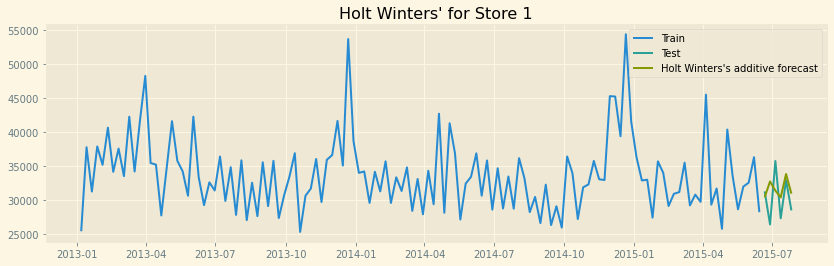

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


{'smoothing_level': 0.07571428571428572, 'smoothing_trend': 0.05408163265306124, 'smoothing_seasonal': 0.1026984126984127, 'damping_trend': nan, 'initial_level': 46245.19027777776, 'initial_trend': 366.6047979797995, 'initial_seasons': array([ 7401.52847222, -5237.56736111, 10574.43263889, -4963.94131944,
        2966.65451389,  -690.81944444,  -184.21840278, -2238.22152778,
       -2022.99236111, -1643.32361111,  -593.59131944, -3367.94027778]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


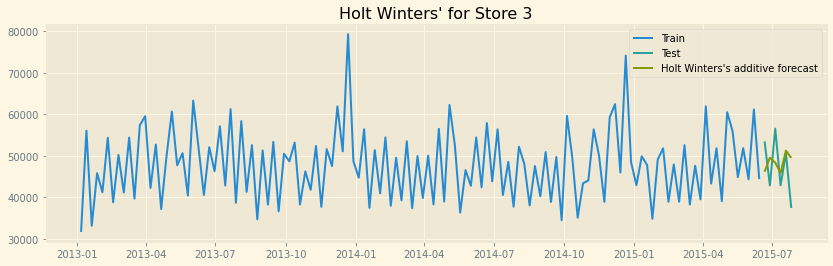

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


{'smoothing_level': 0.07571428571428572, 'smoothing_trend': 0.021632653061224496, 'smoothing_seasonal': 0.1026984126984127, 'damping_trend': nan, 'initial_level': 34032.475185185176, 'initial_trend': 214.19208754208876, 'initial_seasons': array([ 6529.22282986, -4214.87821181,  6126.38324653, -5036.91571181,
        -231.86779514, -1016.18133681,  -284.05946181,  -230.32717014,
       -1016.01258681,  -564.58446181,  1356.14157986, -1416.92092014]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


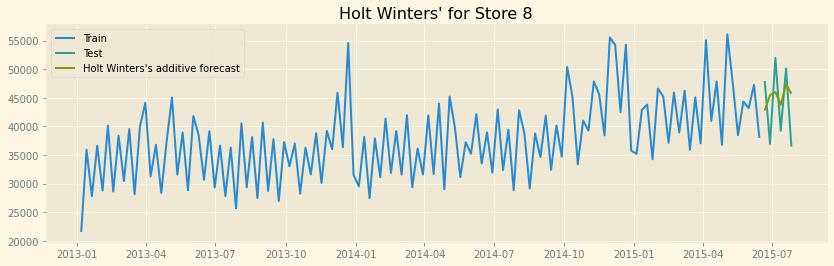

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


{'smoothing_level': 0.040357142857142855, 'smoothing_trend': 0.040357142857142855, 'smoothing_seasonal': 0.06854591836734694, 'damping_trend': nan, 'initial_level': 36862.101574074055, 'initial_trend': 329.4881734006758, 'initial_seasons': array([ 3793.01085069, -3429.44852431,  5605.95043403, -2369.34227431,
        3129.20355903,  -442.07248264,  -743.59539931, -1055.68498264,
        -628.83602431, -1131.81414931,  -821.91935764, -1905.45164931]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


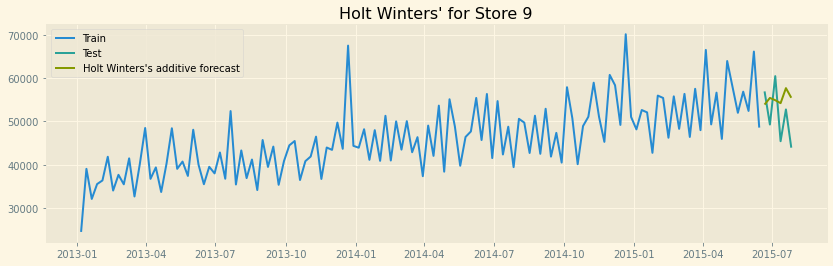

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


{'smoothing_level': 0.07571428571428572, 'smoothing_trend': 0.07571428571428572, 'smoothing_seasonal': 0.03423280423280423, 'damping_trend': nan, 'initial_level': 32078.06194444444, 'initial_trend': 372.22520202020405, 'initial_seasons': array([ 6263.22100694, -6911.36232639,  6714.45850694, -7446.98732639,
        1865.11163194,   634.65642361,  1477.27517361,  1452.10538194,
         771.52517361,  -139.10190972,  -494.63315972, -4186.26857639]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


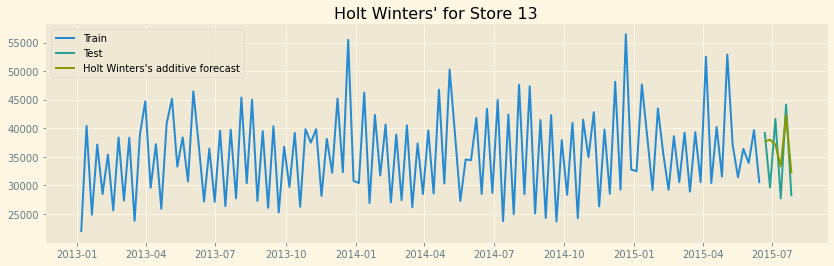

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


{'smoothing_level': 0.21714285714285714, 'smoothing_trend': 0.0334065934065934, 'smoothing_seasonal': 0.06262857142857144, 'damping_trend': nan, 'initial_level': 75105.49646654716, 'initial_trend': 1857.4329909308171, 'initial_seasons': array([ 7639.96847932, -6659.87713   , 11758.85489285, -3376.02067839,
        3080.09837403,   902.99995333,  1874.33140494,  1483.50959715,
       -3239.83415285, -4689.83415285, -2762.83936119, -6011.35722633]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


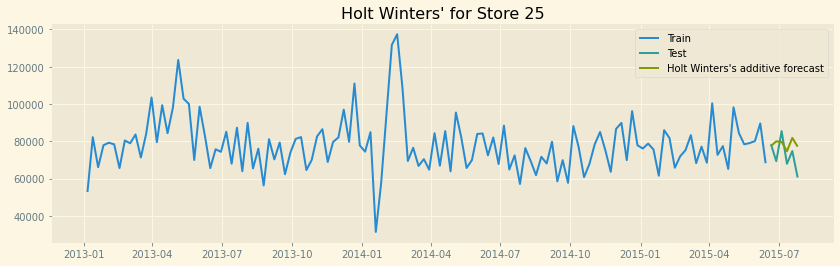

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


{'smoothing_level': 0.040357142857142855, 'smoothing_trend': 0.008071428571428571, 'smoothing_seasonal': 0.10281887755102041, 'damping_trend': nan, 'initial_level': 44293.60814814812, 'initial_trend': 191.10937710438066, 'initial_seasons': array([ 6620.39427083, -5993.3015625 ,  7687.0296875 , -4898.14427083,
        2306.71822917, -1404.34010417,  -197.2390625 ,  -220.40364583,
       -1087.21302083, -1083.2953125 ,   206.7984375 , -1937.00364583]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


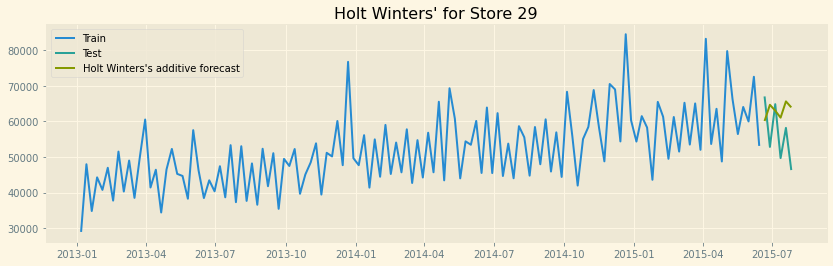

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


{'smoothing_level': 0.040357142857142855, 'smoothing_trend': 0.040357142857142855, 'smoothing_seasonal': 0.10281887755102041, 'damping_trend': nan, 'initial_level': 39619.78712962961, 'initial_trend': 178.51019360269584, 'initial_seasons': array([ 8130.75243056, -2767.16631944,  5945.57951389, -3176.53923611,
       -1713.40069444, -1494.55173611,  1822.25451389,  -760.94861111,
        -846.21840278, -2944.36631944, -1011.86944444, -1183.52569444]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


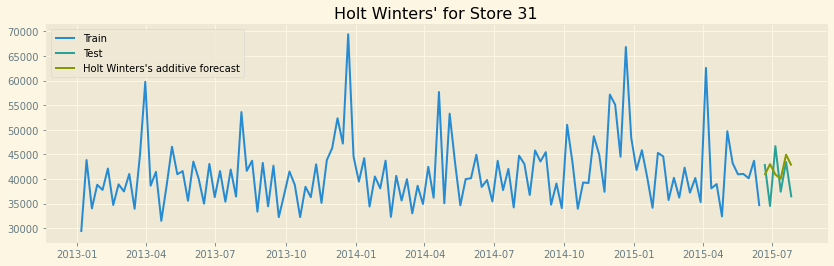

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


{'smoothing_level': 0.07571428571428572, 'smoothing_trend': 0.05408163265306124, 'smoothing_seasonal': 0.0001, 'damping_trend': nan, 'initial_level': 34648.72120370368, 'initial_trend': 337.67051346801554, 'initial_seasons': array([ 6347.884375  , -4459.80520833,  6750.55416667, -4743.05      ,
        1291.16354167,  -134.92291667,   456.903125  ,   138.55416667,
        -195.85416667,  -372.3375    ,  -301.10833333, -4777.98125   ]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


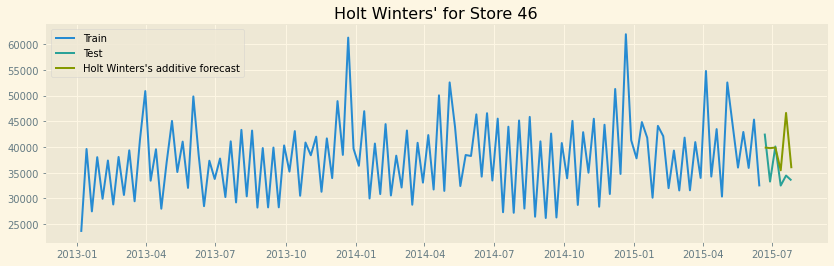

In [66]:
for key in traintest.keys():
    holtwinter(traintest,key)

In [67]:
# calculating Mean-Squared Error, Mean Absolute Percentage Error
results = pd.DataFrame(columns = ['Method', 'RMSE', 'MAPE','Accuracy'])
for key in holtwinter_df.keys():
    rmse = np.sqrt(mean_squared_error(y_true = traintest[key][1]['Sales'], y_pred = holtwinter_df[key]['hw_forecast'])).round(2)
    mape = np.round(np.mean(np.abs(traintest[key][1]['Sales']-holtwinter_df[key]['hw_forecast'])/traintest[key][1]['Sales'])*100,2)
    acc = 100 - mape
    temp = pd.DataFrame({'Method':['Holt Winters\' for Store '+str(key)], 'MAPE': [mape], 'RMSE': [rmse], 'Accuracy':[acc]})
    results = pd.concat([results,temp])
    results = results[['Method', 'RMSE', 'MAPE','Accuracy']]
results

,Method,RMSE,MAPE,Accuracy
0,Holt Winters' for Store 1,3557.19,10.24,89.76
0,Holt Winters' for Store 3,7297.67,14.01,85.99
0,Holt Winters' for Store 8,6453.57,14.68,85.32
0,Holt Winters' for Store 9,7215.02,13.65,86.35
0,Holt Winters' for Store 13,4903.85,13.69,86.31
0,Holt Winters' for Store 25,9282.07,11.67,88.33
0,Holt Winters' for Store 29,10674.20,18.17,81.83
0,Holt Winters' for Store 31,5195.92,11.76,88.24
0,Holt Winters' for Store 46,5950.09,12.99,87.01


The above table reflects the performance of our Holt-Winter's Performance for each of the 9 stores


**Scaling variables**


In [68]:
#from sklearn.preprocessing import MinMaxScaler
#scaler = {}
#multivariateCol=['Sales','Customers']

#for key,store in store_all.items():
#  scaler[key]= MinMaxScaler()
#  scaler[key].fit(traintest[key][0][multivariateCol])
#  traintest[key][0][multivariateCol] = scaler[key].transform(traintest[key][0][multivariateCol])
#  traintest[key][1][multivariateCol] = scaler[key].transform(traintest[key][1][multivariateCol])

ADF Test


In [69]:
from statsmodels.tsa.stattools import adfuller
NonStationary=[]
def ADF_test(data,store,col,signif=0.05):

    r = adfuller(data[col], autolag='AIC')
    output = {'test_statistic':round(r[0], 4), 'pvalue':round(r[1], 4), 'n_lags':round(r[2], 4), 'n_obs':r[3]}
    p_value = output['pvalue'] 
    def adjust(val, length= 6): return str(val).ljust(length)

    # Print Summary
    print('\033[1m  Augmented Dickey-Fuller Test on '+col+' for Store:' , store, '\033[0m ')
    print(f' Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f' Significance Level    = {signif}')
    print(f' Test Statistic        = {output["test_statistic"]}')
    print(f' No. Lags Chosen       = {output["n_lags"]}')

    for key,val in r[4].items():
        print(f' Critical value {adjust(key)} = {round(val, 3)}')

    if p_value <= signif:
        print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
        print(f" => Series is Stationary.")
    else:
        print(f" => P-Value = {p_value}. Fail to reject the Null Hypothesis.")
        print(f" => Series is Non-Stationary.")
        NonStationary.append(store)
          
    print('\n')

In [70]:
#Sales Stationarity check
for key,store in store_all.items():
    ADF_test(store,key,'Sales')

  Augmented Dickey-Fuller Test on Sales for Store: 1  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -5.2494
 No. Lags Chosen       = 17
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


  Augmented Dickey-Fuller Test on Sales for Store: 3  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -5.8052
 No. Lags Chosen       = 22
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


  Augmented Dickey-Fuller Test on Sales for Store: 8  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -3.3823
 No. Lags Chosen       = 21
 Critical value 1%     = -3.437
 Critical value 5%     = -2.

Inference:

For all the Stores, Sales is Stationary series


In [71]:
#Customers Stationarity check
for key,store in store_all.items():
    ADF_test(store,key,'Customers')

  Augmented Dickey-Fuller Test on Customers for Store: 1  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -4.025
 No. Lags Chosen       = 21
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0013. Rejecting Null Hypothesis.
 => Series is Stationary.


  Augmented Dickey-Fuller Test on Customers for Store: 3  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -5.5075
 No. Lags Chosen       = 22
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


  Augmented Dickey-Fuller Test on Customers for Store: 8  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -3.1673
 No. Lags Chosen       = 21
 Critical value 1%     = -3.437
 Critical valu

Inference:

For all the Stores, Customers is Stationary series


In [72]:
# SalesPerCustomer Stationarity check
for key,store in store_all.items():
    ADF_test(store,key,'SalePerCustomer')

  Augmented Dickey-Fuller Test on SalePerCustomer for Store: 1  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -6.5428
 No. Lags Chosen       = 16
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


  Augmented Dickey-Fuller Test on SalePerCustomer for Store: 3  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -4.7429
 No. Lags Chosen       = 22
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0001. Rejecting Null Hypothesis.
 => Series is Stationary.


  Augmented Dickey-Fuller Test on SalePerCustomer for Store: 8  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -3.9547
 No. Lags Chosen       = 21
 Critical value 1%     = -3

Inference:

For all the Stores, SalePerCustomer is Stationary series

As all the series are already stationary we don't need any kind of transformation (log/boxcox) or differencing.



**Johansen Test**


In [73]:
def johansen_test(data,store):
    print("\033[1m Johansen Test for Store: ", store,' \033[0m')
    output = pd.DataFrame([data.lr2,data.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",data.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",data.cvt,'\n')
    print('\n')


In [74]:
from statsmodels.tsa.vector_ar.vecm import coint_johansen
for key,store in store_all.items():
    johansen_df = coint_johansen(store[['Sales','Customers']],0,15) # k_ar_diff +1 = K
    johansen_test(johansen_df,key)

 Johansen Test for Store:  1  
   max_eig_stat  trace_stat
0     49.966868   58.888727
1      8.921860    8.921860 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[12.2971 14.2639 18.52  ]
 [ 2.7055  3.8415  6.6349]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[13.4294 15.4943 19.9349]
 [ 2.7055  3.8415  6.6349]] 



 Johansen Test for Store:  3  
   max_eig_stat  trace_stat
0     62.452855   88.102653
1     25.649798   25.649798 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[12.2971 14.2639 18.52  ]
 [ 2.7055  3.8415  6.6349]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[13.4294 15.4943 19.9349]
 [ 2.7055  3.8415  6.6349]] 



 Johansen Test for Store:  8  
   max_eig_stat  trace_stat
0     42.097072   58.960007
1     16.862935   16.862935 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[12.2971 14.2639 18.52  ]
 [ 2.7055  3.8415  6.6349]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[13.4294 15.4943 19.9349]
 [ 2.7055  3.8415  6.6349]] 



 Johansen Test for 

**Grangers Causality Test**


In [75]:
#Grangers Causality Test
from statsmodels.tsa.stattools import grangercausalitytests
maxlag=30
test = 'ssr_chi2test'
def grangers_causation_matrix(data, variables,store, test='ssr_chi2test', verbose=False):    
    print("\033[1m Grangers Causality Test for Store: ",store,'\033[0m')

    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in df.columns:
        for r in df.index:
            test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            df.loc[r, c] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    print(df)
    print('\n')

In [76]:
for key,store in store_all.items():
      grangers_causation_matrix(store, variables = store[['Customers','Sales','SalePerCustomer']].columns,store=key)  

 Grangers Causality Test for Store:  1 
                   Customers_x  Sales_x  SalePerCustomer_x
Customers_y                1.0      0.0                0.0
Sales_y                    0.0      1.0                0.0
SalePerCustomer_y          0.0      0.0                1.0


 Grangers Causality Test for Store:  3 
                   Customers_x  Sales_x  SalePerCustomer_x
Customers_y                1.0      0.0                0.0
Sales_y                    0.0      1.0                0.0
SalePerCustomer_y          0.0      0.0                1.0


 Grangers Causality Test for Store:  8 
                   Customers_x  Sales_x  SalePerCustomer_x
Customers_y                1.0      0.0                0.0
Sales_y                    0.0      1.0                0.0
SalePerCustomer_y          0.0      0.0                1.0


 Grangers Causality Test for Store:  9 
                   Customers_x  Sales_x  SalePerCustomer_x
Customers_y                1.0      0.0                0.0
Sales_y 

In [77]:
#checking if there is uniqueness in SchoolHoliday and StateHoliday
for key,store in store_all.items():
    unique_StateHoliday = store['StateHoliday'].unique()
    unique_SchoolHoliday = store['SchoolHoliday'].unique()
    print('unique StateHoliday Values for Store ',key,": ",len(unique_StateHoliday))
    print('unique SchoolHoliday Values for Store ',key,': ',len(unique_SchoolHoliday))
    print('\n')

unique StateHoliday Values for Store  1 :  1
unique SchoolHoliday Values for Store  1 :  2


unique StateHoliday Values for Store  3 :  1
unique SchoolHoliday Values for Store  3 :  2


unique StateHoliday Values for Store  8 :  1
unique SchoolHoliday Values for Store  8 :  2


unique StateHoliday Values for Store  9 :  1
unique SchoolHoliday Values for Store  9 :  2


unique StateHoliday Values for Store  13 :  1
unique SchoolHoliday Values for Store  13 :  2


unique StateHoliday Values for Store  25 :  1
unique SchoolHoliday Values for Store  25 :  2


unique StateHoliday Values for Store  29 :  1
unique SchoolHoliday Values for Store  29 :  2


unique StateHoliday Values for Store  31 :  1
unique SchoolHoliday Values for Store  31 :  2


unique StateHoliday Values for Store  46 :  1
unique SchoolHoliday Values for Store  46 :  2




From above observation, its clear that for all store, StateHoliday has only 1 value, hence we will use only SchoolHoliday for predication


**PACF and ACF Plot**


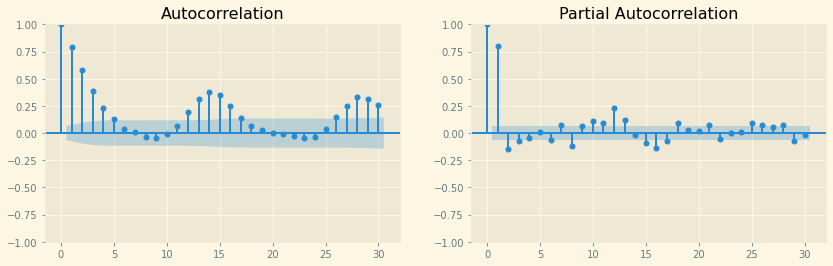

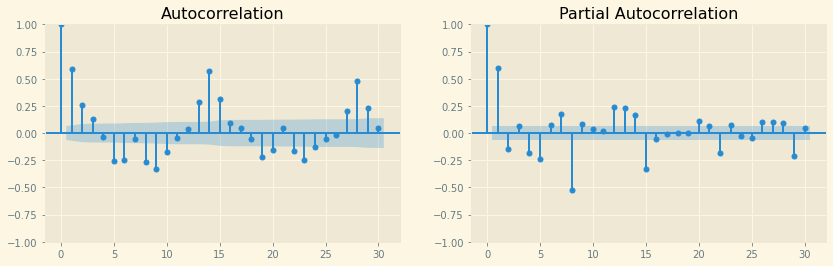

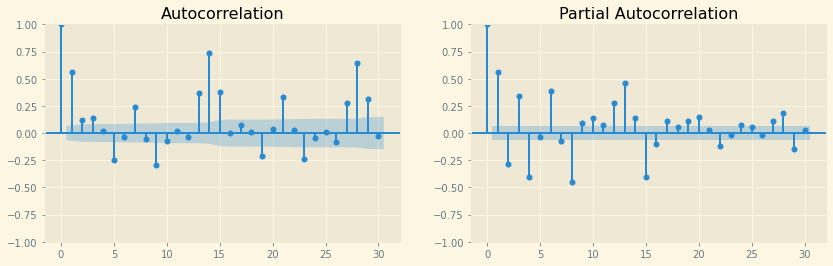

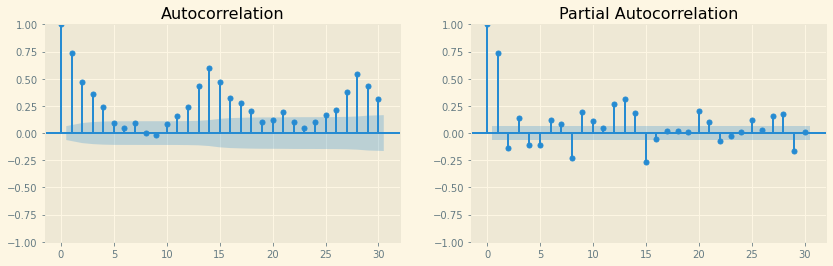

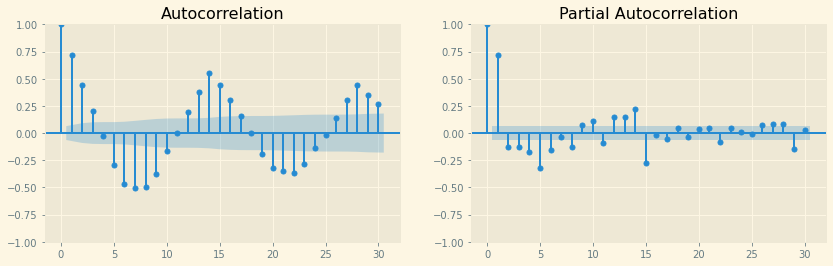

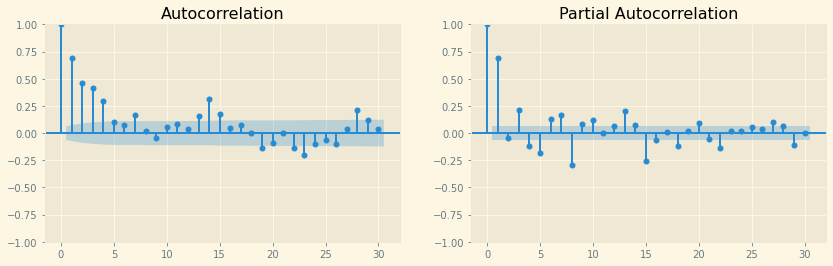

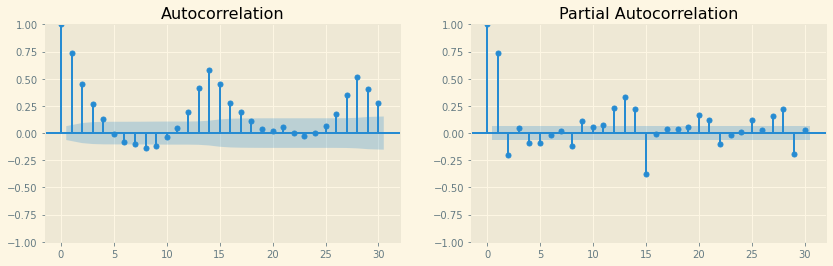

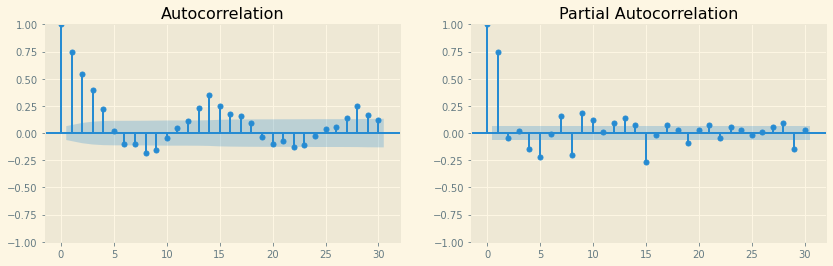

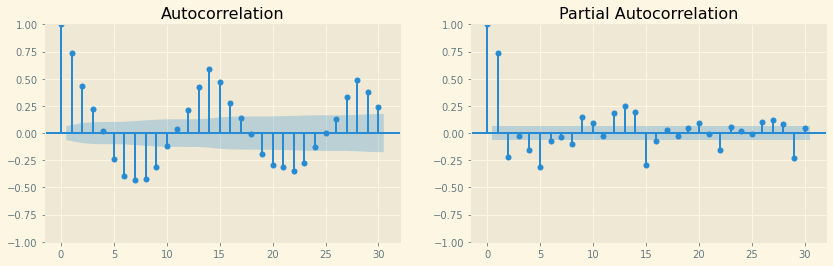

In [78]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
def acf_pacf(data):
    for key, store in data.items():
        plt.figure(figsize=(14, 4))
        plt.subplot(1,2,1)
        plot_acf(store['Sales'], ax=plt.gca(), lags = 30)
        plt.subplot(1,2,2)
        plot_pacf(store['Sales'], ax=plt.gca(), lags = 30)
        plt.show()
    
acf_pacf(store_all)

**SARIMAX**

We'll now be defining multiple functions that will compute SARIMAX model for each store type:



In [79]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
def sarimax_model(data,key,p,q,exog,hasTrend='n',printStats=False):
    #p,q=2,2
    exog =data[key][0][exog]
    mod = SARIMAX(data[key][0]['Sales'], order=(p, 1, q), seasonal_order=(1, 1, 1, 7),exog=exog,trend=hasTrend) 
    res = mod.fit()
    if(printStats):
        print(res.params)
    return mod,res

In [80]:
# function that will make predictions based on the trained model

def predict_sarimax(data,key,mod,res,exogV):
    start = data[key][1].index.min()
    end = data[key][1].index.max()
    predictions = res.predict(start, end,exog=data[key][1][exogV])
    traintest[key][2]=predictions.to_frame(name='Sarima_Pred')

In [81]:
#def inverse_transform(data,key):
    #traintest[key][0][multivariateCol]=scaler[key].inverse_transform(data[0][multivariateCol])
    #traintest[key][1][multivariateCol]=scaler[key].inverse_transform(data[1][multivariateCol])
    #traintest[key][2][multivariateCol]=scaler[key].inverse_transform(data[2][multivariateCol])

In [82]:
# a function to plot the train, test and predictions:

def plot_pred_sarimax(data,key,res,pred,model_name='sarimax'):
    plt.figure(figsize=(15,5)) 
    plt.plot(data[key][0]['Sales'], label='Train')
    plt.plot(data[key][1]['Sales'], label='Test')
    plt.plot(data[key][2][pred], label='Prediction')
    plt.legend(loc='best')
    plt.title(model_name+' Model - Sales '+ str(key))
    plt.show()

In [83]:
# creating a function which will store the values of RMSE, MAPE and Accuracy for each store type:

results = results[['Method','RMSE','MAPE','Accuracy']]
def sarimax_model_metrics(data,key,model_name):
    global results
    rmse = np.sqrt(mean_squared_error(data[key][1]['Sales'], data[key][2]['Sarima_Pred'])).round(2)
    mape = np.round(np.mean(np.abs(data[key][1]['Sales']-data[key][2]['Sarima_Pred'])/data[key][1]['Sales'])*100,2)
    acc = 100 - mape
    temp = pd.DataFrame({'Method':[model_name+' for Store '+str(key)], 'MAPE': [mape], 'RMSE': [rmse], 'Accuracy':[acc]})
    results = pd.concat([results,temp])
    return results

In [84]:
# defining exogenous variables:

exogvariables = ['Promo','SchoolHoliday','DayOfWeek']

/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


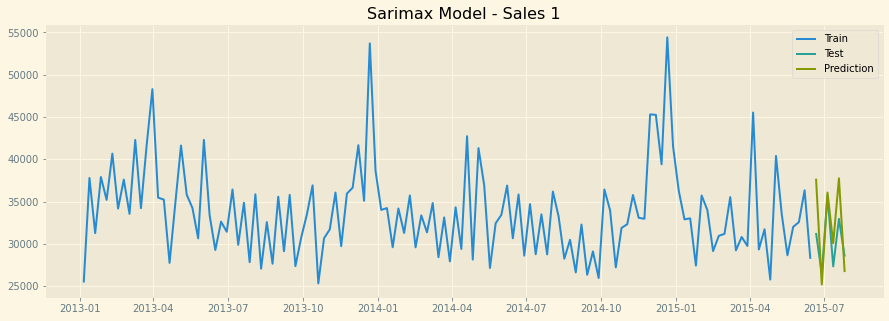

/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


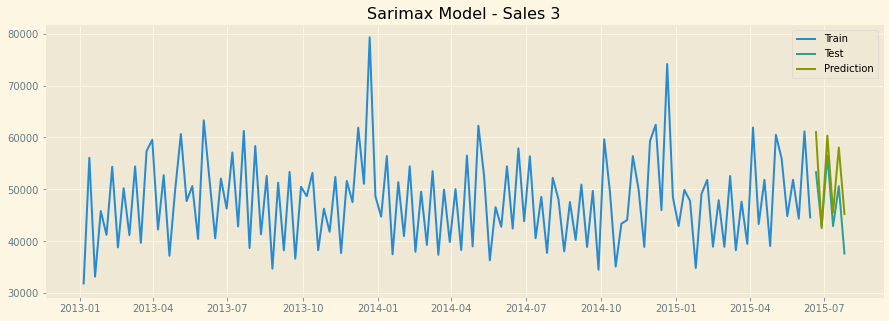

/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


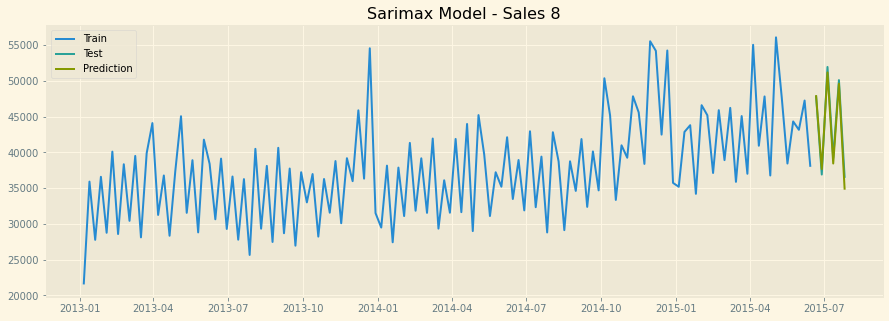

/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


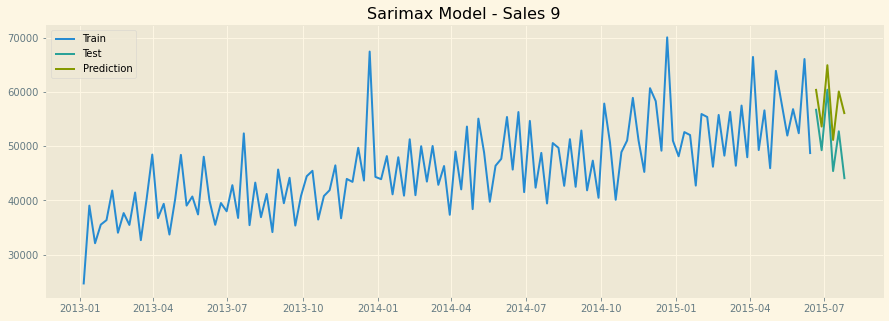

/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


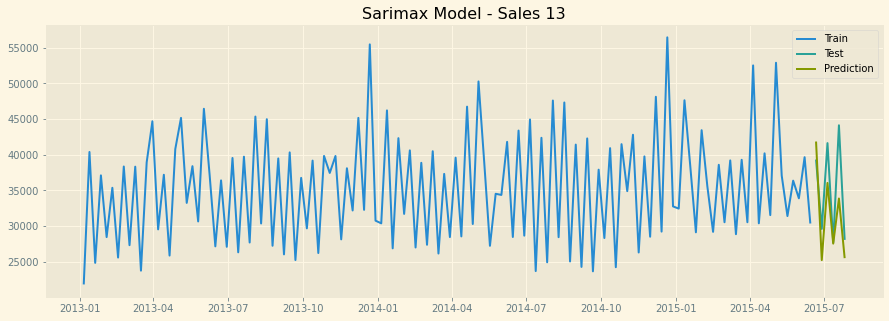

/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


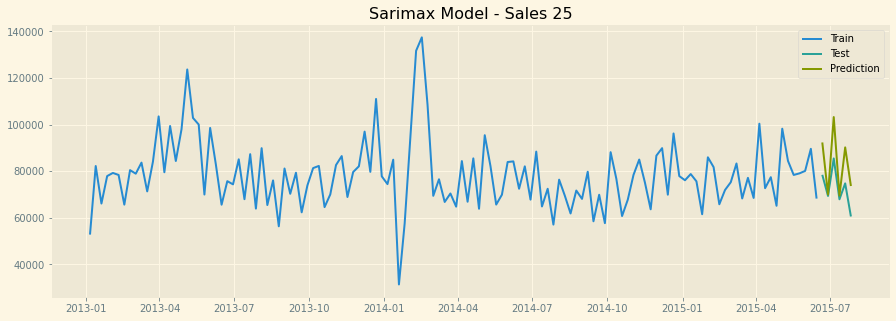

/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


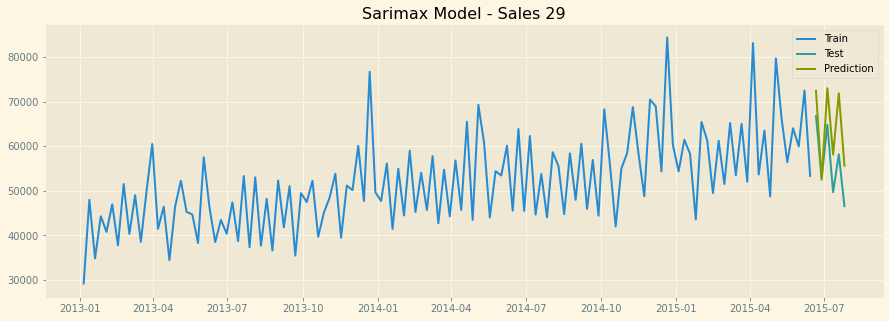

/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


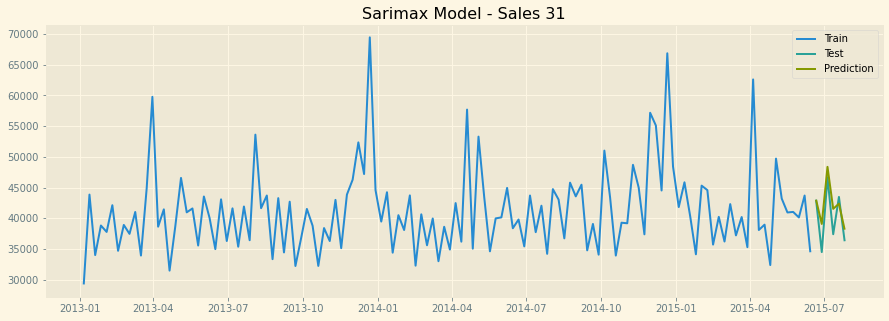

/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


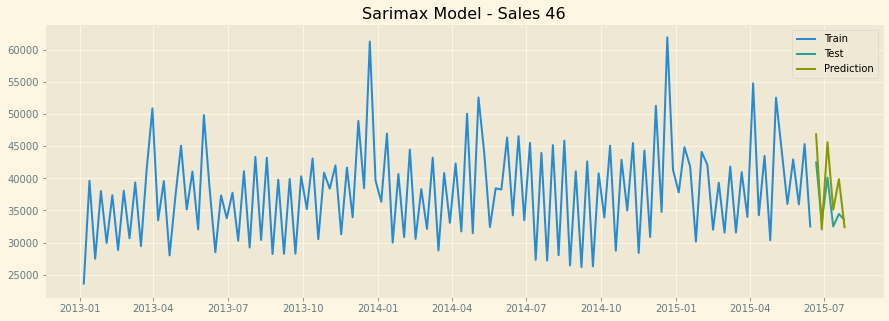

In [85]:
for key in store_all.keys():
    mod,res=sarimax_model(traintest,key,6,6,exog=exogvariables)
    predict_sarimax(traintest,key,mod,res,exogV=exogvariables)
    plot_pred_sarimax(traintest,key,res,'Sarima_Pred','Sarimax')
    sarimax_model_metrics(traintest,key,'Sarimax')

In [86]:
results


,Method,RMSE,MAPE,Accuracy
0,Holt Winters' for Store 1,3557.19,10.24,89.76
0,Holt Winters' for Store 3,7297.67,14.01,85.99
0,Holt Winters' for Store 8,6453.57,14.68,85.32
0,Holt Winters' for Store 9,7215.02,13.65,86.35
0,Holt Winters' for Store 13,4903.85,13.69,86.31
0,Holt Winters' for Store 25,9282.07,11.67,88.33
0,Holt Winters' for Store 29,10674.20,18.17,81.83
0,Holt Winters' for Store 31,5195.92,11.76,88.24
0,Holt Winters' for Store 46,5950.09,12.99,87.01
0,Sarimax for Store 1,3572.22,9.50,90.50


Inference:

We can clearly observe that SARIMAX model has always performed better than VARMAX


**VARMAX**

We'll now be defining multiple functions that will compute VARMAX model for each store type:



In [87]:
def varmax_model(data,key,p,q,exog,hasTrend='n',printStats=False):
    exog =data[key][0][exog]
    mod = sm.tsa.VARMAX(data[key][0][['Sales','Customers']], order=(p,q), trend=hasTrend, exog=exog)
    res = mod.fit(maxiter=1000, disp=False)
    if(printStats):
        print(res.summary())
    return mod,res

In [88]:
# function that will make predictions based on the trained model

def predict_varmax(data,key,mod,res,exog):
    start = data[key][1].index.min()
    end = data[key][1].index.max()
    exog = data[key][1][exog]
    predictions = res.predict(start=start, end=end, exog=exog)
    traintest[key][3]=predictions

In [89]:
# a function to plot the train, test and predictions:

def plot_pred_varmax(data,key,res,model_name='varmax'):
    plt.figure(figsize=(15,5)) 
    plt.plot(data[key][0]['Sales'], label='Train')
    plt.plot(data[key][1]['Sales'], label='Test')
    plt.plot(data[key][3]['Sales'], label='Prediction')
    plt.legend(loc='best')
    plt.title(model_name+' Model - Sales of Store '+ str(key))
    plt.show()

In [90]:
# creating a function which will store the values of RMSE, MAPE and Accuracy for each store type:

results = results[['Method','RMSE','MAPE','Accuracy']]
def varmax_model_metrics(data,key,model_name):
    global results
    rmse = np.sqrt(mean_squared_error(data[key][1]['Sales'], data[key][3]['Sales'])).round(2)
    mape = np.round(np.mean(np.abs(data[key][1]['Sales']-data[key][3]['Sales'])/data[key][1]['Sales'])*100,2)
    acc = 100 - mape
    temp = pd.DataFrame({'Method':[str(model_name)+' for Store '+str(key)], 'MAPE': [mape], 'RMSE': [rmse], 'Accuracy':[acc]})
    results = pd.concat([results,temp])
    return results

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


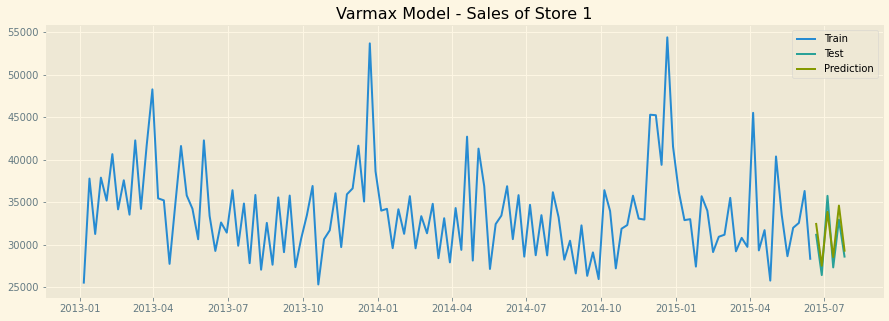

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


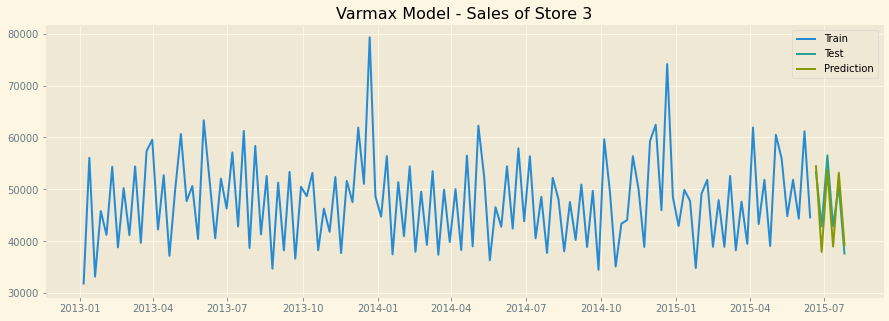

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is 

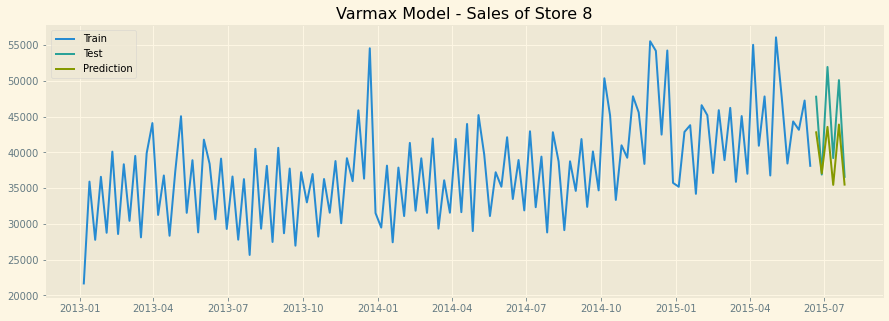

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is 

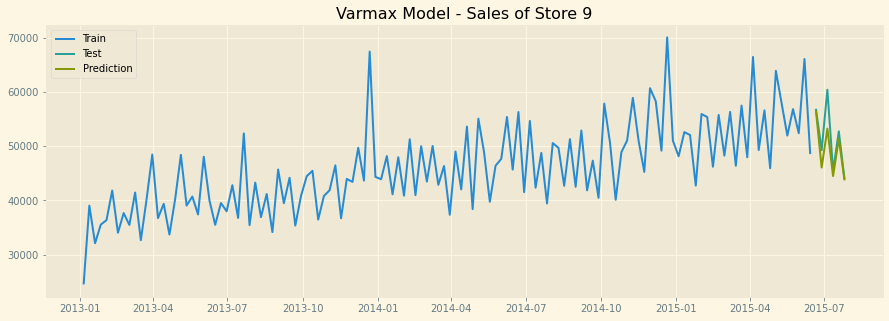

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


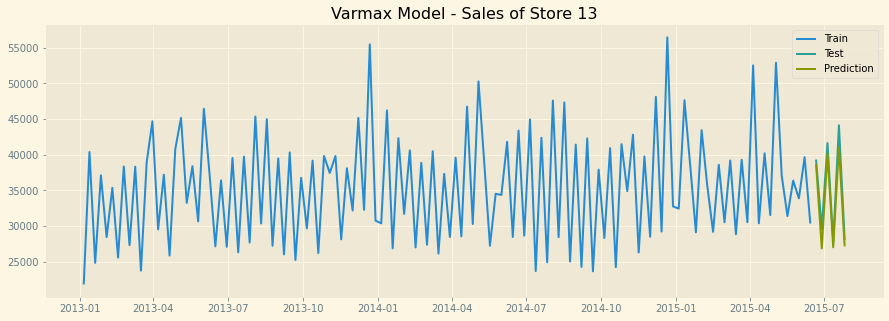

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


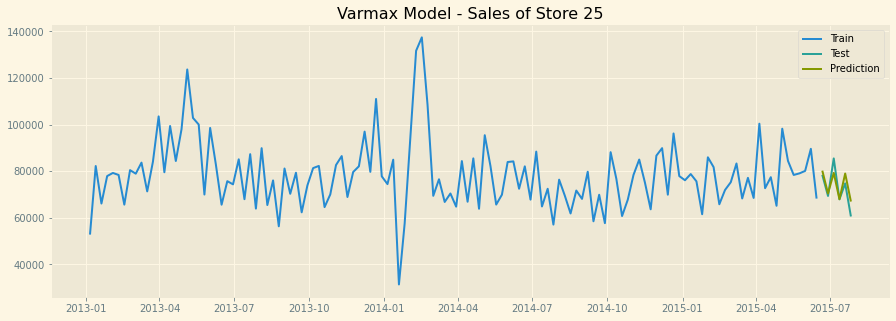

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


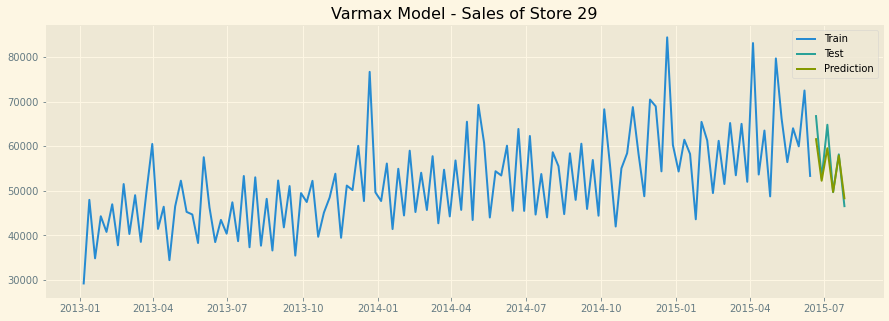

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is 

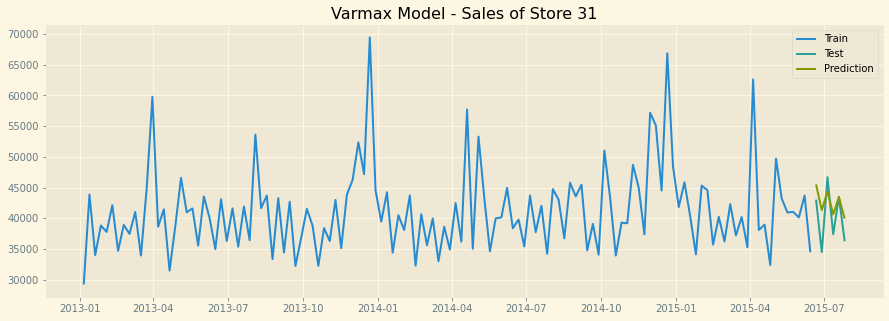

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


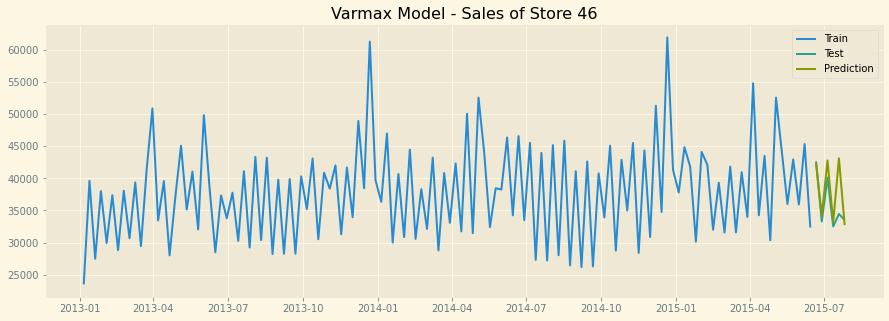

In [91]:
for key in store_all.keys():
    mod,res=varmax_model(traintest,key,2,2,exog=exogvariables)
    predict_varmax(traintest,key,mod,res,exog=exogvariables)
    plot_pred_varmax(traintest,key,res,'Varmax')
    varmax_model_metrics(traintest,key,'Varmax')

In [92]:
results

,Method,RMSE,MAPE,Accuracy
0,Holt Winters' for Store 1,3557.19,10.24,89.76
0,Holt Winters' for Store 3,7297.67,14.01,85.99
0,Holt Winters' for Store 8,6453.57,14.68,85.32
0,Holt Winters' for Store 9,7215.02,13.65,86.35
0,Holt Winters' for Store 13,4903.85,13.69,86.31
0,Holt Winters' for Store 25,9282.07,11.67,88.33
0,Holt Winters' for Store 29,10674.20,18.17,81.83
0,Holt Winters' for Store 31,5195.92,11.76,88.24
0,Holt Winters' for Store 46,5950.09,12.99,87.01
0,Sarimax for Store 1,3572.22,9.50,90.50


Inference:



*  We have calculated the RMSE, MAPE and Accuracy of all our three time series model for all 9 stores.


*   Clearly we can observe that for Stores 1, 3, 9, 13, 25, 29 and 46, VARMAX has performed better.

*   For Stores 8 and 31 SARIMAX model was able to beat VARMAX with
better accuracy and lower MAPE values






**Next 6 Week Forecast (Store-wise)**


As per the problem statement we need to forecast next 6 week Sales for all 9 given stores. For this we'll use only that model which performed the best. Thereby, comparing individual MAPE values of all 3 trained models and choosing the best out of them for each store respectively.



**STORE 1 : VARMAX**


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is 

                   Sales    Customers
2015-08-09  28108.710934  3184.369682
2015-08-16  23121.206223  2905.184054
2015-08-23  31168.030408  3485.951881
2015-08-30  25839.957062  3203.132098
2015-09-06  32348.072159  3662.508206
2015-09-13  27329.984578  3378.713330


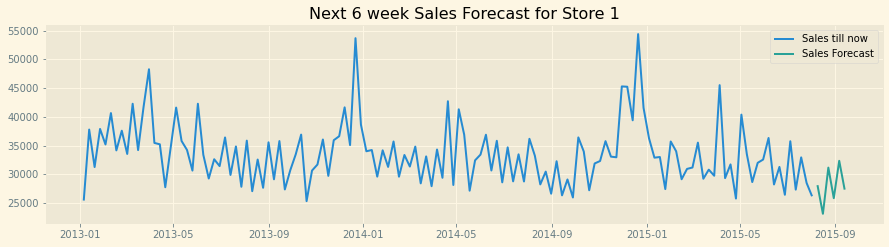

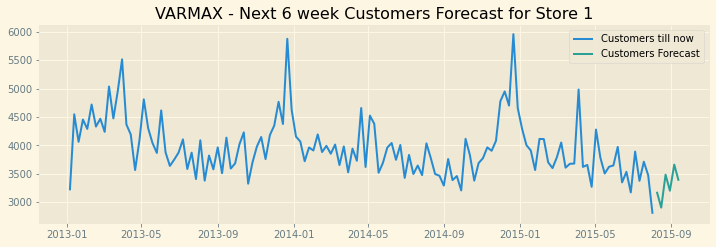

In [93]:
from statsmodels.tsa.statespace.varmax import VARMAXResults
mod = sm.tsa.VARMAX(store_all[1][['Sales','Customers']].resample('W').sum(), order=(2,2), trend='n', exog=store_all[1][exogvariables].resample('W').sum())
res = mod.fit(maxiter=1000, disp=False)
result_forecast = res.forecast(steps=6,exog=traintest[1][1][exogvariables])
print(result_forecast)

plt.figure(figsize=(15,8))
plt.subplot(2,1,1)
plt.plot(store_all[1]['Sales'].resample('W').sum(), label='Sales till now')
plt.plot(result_forecast['Sales'], label='Sales Forecast')
plt.title('Next 6 week Sales Forecast for Store 1')
plt.legend()
plt.show()
plt.subplot(2,1,2)
plt.plot(store_all[1]['Customers'].resample('W').sum(), label='Customers till now')
plt.plot(result_forecast['Customers'],label='Customers Forecast')
plt.title('VARMAX - Next 6 week Customers Forecast for Store 1')
plt.legend()
plt.show()

**STORE 3 : VARMAX**


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


                   Sales    Customers
2015-08-09  48342.898067  4914.256339
2015-08-16  32009.104363  4254.323791
2015-08-23  52923.042782  5276.900354
2015-08-30  39897.380882  4525.246102
2015-09-06  52034.909033  5332.932424
2015-09-13  38997.471200  4576.939308


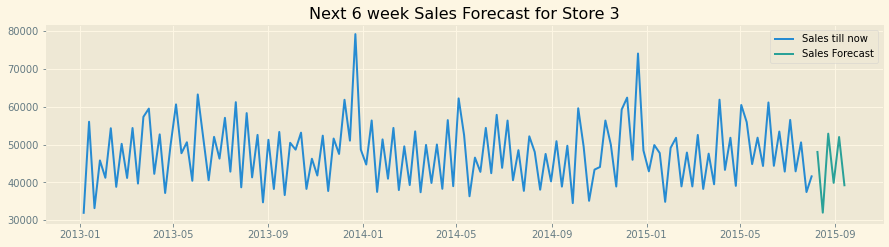

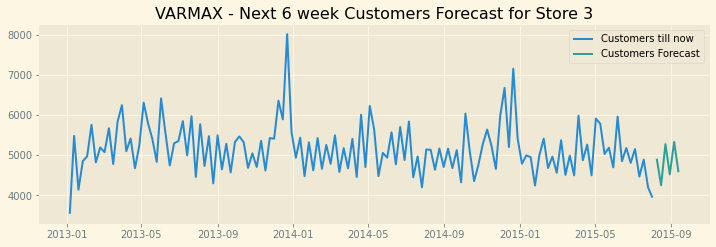

In [94]:
from statsmodels.tsa.statespace.varmax import VARMAXResults
mod = sm.tsa.VARMAX(store_all[3][['Sales','Customers']].resample('W').sum(), 
                    order=(2,2), trend='n', exog=store_all[3][exogvariables].resample('W').sum())
res = mod.fit(maxiter=1000, disp=False)
result_forecast = res.forecast(steps=6,exog=traintest[3][1][exogvariables])
print(result_forecast)

plt.figure(figsize=(15,8))
plt.subplot(2,1,1)
plt.plot(store_all[3]['Sales'].resample('W').sum(), label='Sales till now')
plt.plot(result_forecast['Sales'], label='Sales Forecast')
plt.title('Next 6 week Sales Forecast for Store 3')
plt.legend()
plt.show()
plt.subplot(2,1,2)
plt.plot(store_all[3]['Customers'].resample('W').sum(), label='Customers till now')
plt.plot(result_forecast['Customers'],label='Customers Forecast')
plt.title('VARMAX - Next 6 week Customers Forecast for Store 3')
plt.legend()
plt.show()

**STORE 8 : SARIMAX**


/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                   Sales    Customers
2015-08-09  48906.639376  5282.550530
2015-08-16  36944.414572  4616.945112
2015-08-23  48053.349928  5266.344212
2015-08-30  39436.954637  4766.818862
2015-09-06  51362.788366  5389.025269
2015-09-13  36840.651736  4479.066026


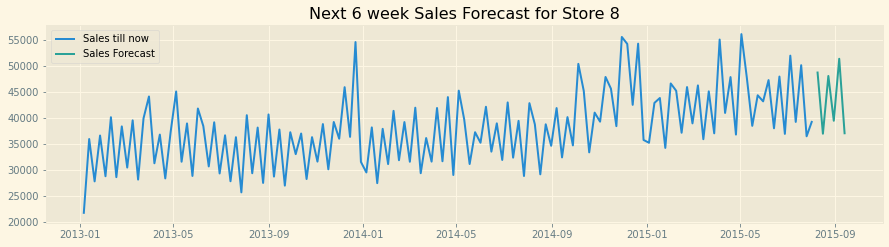

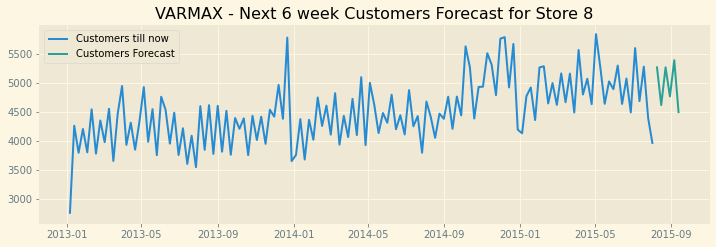

In [95]:
from statsmodels.tsa.statespace.sarimax import SARIMAXResults
mod = SARIMAX(store_all[8][['Sales']].resample('W').sum(), order=(6, 1, 6), 
              seasonal_order=(1, 1, 1, 7),exog=store_all[8][exogvariables].resample('W').sum(),trend='n') 
res = mod.fit()
result_forecast = res.forecast(steps=6,exog=traintest[8][1][exogvariables])
result_forecast = result_forecast.to_frame(name = 'Sales')

mod = SARIMAX(store_all[8][['Customers']].resample('W').sum(), order=(6, 1, 6), 
              seasonal_order=(1, 1, 1, 7),exog=store_all[8][exogvariables].resample('W').sum(),trend='n') 
res = mod.fit()
result_forecast['Customers'] = res.forecast(steps=6,exog=traintest[8][1][exogvariables])
print(result_forecast)

plt.figure(figsize=(15,8))
plt.subplot(2,1,1)
plt.plot(store_all[8]['Sales'].resample('W').sum(), label='Sales till now')
plt.plot(result_forecast['Sales'], label='Sales Forecast')
plt.title('Next 6 week Sales Forecast for Store 8')
plt.legend()
plt.show()
plt.subplot(2,1,2)
plt.plot(store_all[8]['Customers'].resample('W').sum(), label='Customers till now')
plt.plot(result_forecast['Customers'],label='Customers Forecast')
plt.title('VARMAX - Next 6 week Customers Forecast for Store 8')
plt.legend()
plt.show()

**STORE 9 : VARMAX**


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


                   Sales    Customers
2015-08-09  42635.926958  3705.230688
2015-08-16  43942.647042  3643.414554
2015-08-23  43187.716796  3757.854689
2015-08-30  41576.034517  3592.860980
2015-09-06  43914.398582  3826.770898
2015-09-13  40488.594500  3594.440038


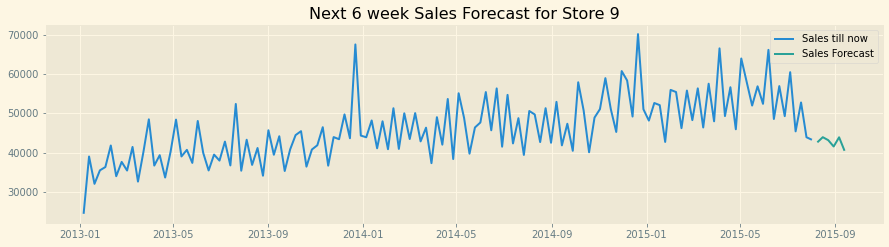

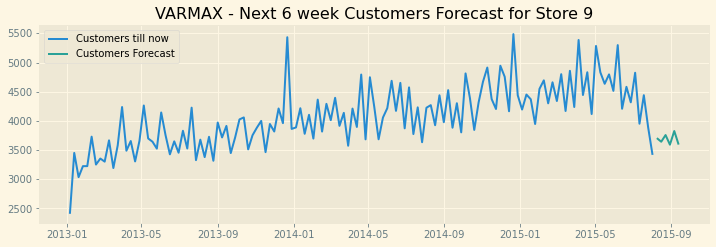

In [96]:
from statsmodels.tsa.statespace.varmax import VARMAXResults
mod = sm.tsa.VARMAX(store_all[9][['Sales','Customers']].resample('W').sum(), 
                    order=(2,2), trend='n', exog=store_all[9][exogvariables].resample('W').sum())
res = mod.fit(maxiter=1000, disp=False)
result_forecast = res.forecast(steps=6,exog=traintest[9][1][exogvariables])
print(result_forecast)

plt.figure(figsize=(15,8))
plt.subplot(2,1,1)
plt.plot(store_all[9]['Sales'].resample('W').sum(), label='Sales till now')
plt.plot(result_forecast['Sales'], label='Sales Forecast')
plt.title('Next 6 week Sales Forecast for Store 9')
plt.legend()
plt.show()
plt.subplot(2,1,2)
plt.plot(store_all[9]['Customers'].resample('W').sum(), label='Customers till now')
plt.plot(result_forecast['Customers'],label='Customers Forecast')
plt.title('VARMAX - Next 6 week Customers Forecast for Store 9')
plt.legend()
plt.show()

**STORE 13 : VARMAX**


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


                   Sales    Customers
2015-08-09  31499.333239  2217.781058
2015-08-16  29770.455025  2131.297713
2015-08-23  34004.242942  2384.667047
2015-08-30  26714.653907  2015.825541
2015-09-06  36747.294353  2576.539141
2015-09-13  25936.315693  2021.975177


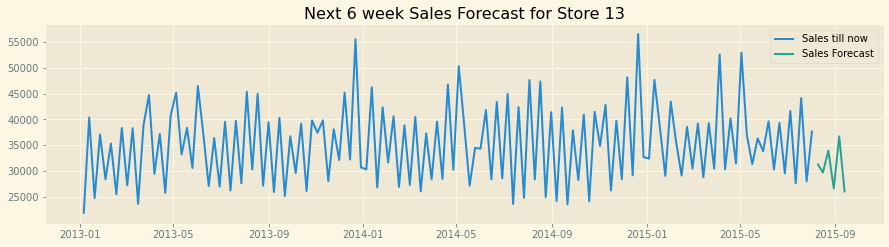

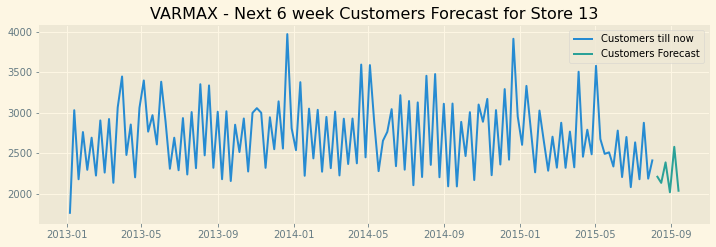

In [97]:
from statsmodels.tsa.statespace.varmax import VARMAXResults
mod = sm.tsa.VARMAX(store_all[13][['Sales','Customers']].resample('W').sum(), 
                    order=(2,2), trend='n', exog=store_all[13][exogvariables].resample('W').sum())
res = mod.fit(maxiter=1000, disp=False)
result_forecast = res.forecast(steps=6,exog=traintest[13][1][exogvariables])
print(result_forecast)

plt.figure(figsize=(15,8))
plt.subplot(2,1,1)
plt.plot(store_all[13]['Sales'].resample('W').sum(), label='Sales till now')
plt.plot(result_forecast['Sales'], label='Sales Forecast')
plt.title('Next 6 week Sales Forecast for Store 13')
plt.legend()
plt.show()
plt.subplot(2,1,2)
plt.plot(store_all[13]['Customers'].resample('W').sum(), label='Customers till now')
plt.plot(result_forecast['Customers'],label='Customers Forecast')
plt.title('VARMAX - Next 6 week Customers Forecast for Store 13')
plt.legend()
plt.show()

**STORE 25 : VARMAX**


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


                   Sales    Customers
2015-08-09  74216.070039  8852.864054
2015-08-16  62157.413647  8121.764462
2015-08-23  73445.933882  9327.063790
2015-08-30  61665.900943  8406.204212
2015-09-06  74704.437375  9689.316583
2015-09-13  62563.290268  8695.331584


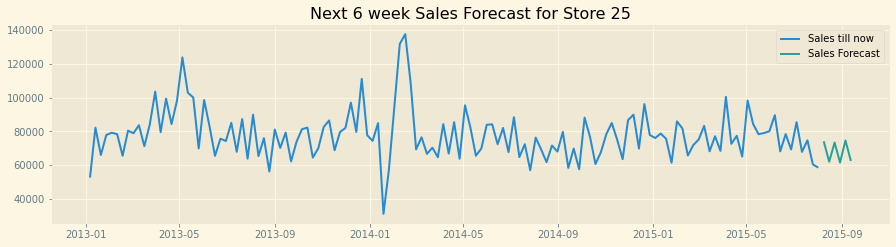

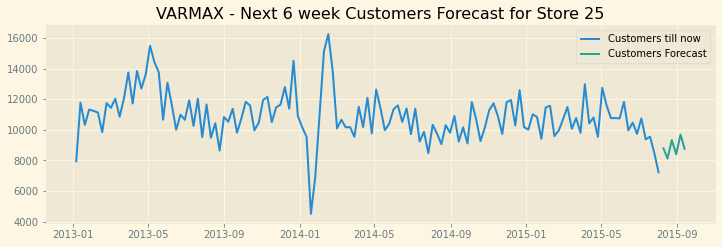

In [98]:
from statsmodels.tsa.statespace.varmax import VARMAXResults
mod = sm.tsa.VARMAX(store_all[25][['Sales','Customers']].resample('W').sum(), 
                    order=(2,2), trend='n', exog=store_all[25][exogvariables].resample('W').sum())
res = mod.fit(maxiter=1000, disp=False)
result_forecast = res.forecast(steps=6,exog=traintest[25][1][exogvariables])
print(result_forecast)

plt.figure(figsize=(15,8))
plt.subplot(2,1,1)
plt.plot(store_all[25]['Sales'].resample('W').sum(), label='Sales till now')
plt.plot(result_forecast['Sales'], label='Sales Forecast')
plt.title('Next 6 week Sales Forecast for Store 25')
plt.legend()
plt.show()
plt.subplot(2,1,2)
plt.plot(store_all[25]['Customers'].resample('W').sum(), label='Customers till now')
plt.plot(result_forecast['Customers'],label='Customers Forecast')
plt.title('VARMAX - Next 6 week Customers Forecast for Store 25')
plt.legend()
plt.show()

**STORE 29 : VARMAX**


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


                   Sales    Customers
2015-08-09  49790.704794  4165.297788
2015-08-16  45464.464543  3845.631612
2015-08-23  51124.748794  4286.395502
2015-08-30  44462.569773  3876.400747
2015-09-06  51988.338516  4392.457653
2015-09-13  44253.696886  3929.574403


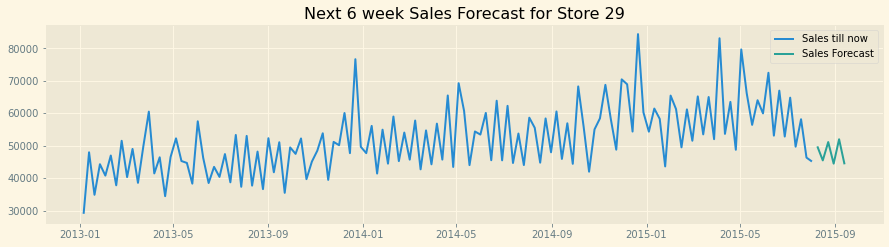

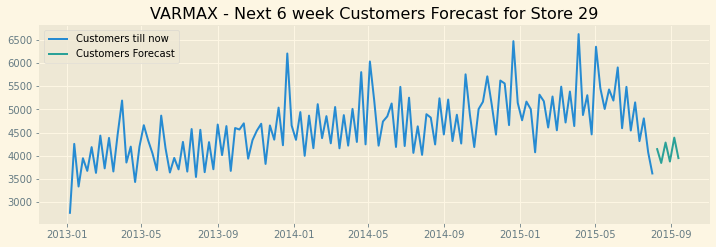

In [99]:
from statsmodels.tsa.statespace.varmax import VARMAXResults
mod = sm.tsa.VARMAX(store_all[29][['Sales','Customers']].resample('W').sum(), order=(2,2), trend='n', exog=store_all[29][exogvariables].resample('W').sum())
res = mod.fit(maxiter=1000, disp=False)
result_forecast = res.forecast(steps=6,exog=traintest[29][1][exogvariables])
print(result_forecast)

plt.figure(figsize=(15,8))
plt.subplot(2,1,1)
plt.plot(store_all[29]['Sales'].resample('W').sum(), label='Sales till now')
plt.plot(result_forecast['Sales'], label='Sales Forecast')
plt.title('Next 6 week Sales Forecast for Store 29')
plt.legend()
plt.show()
plt.subplot(2,1,2)
plt.plot(store_all[29]['Customers'].resample('W').sum(), label='Customers till now')
plt.plot(result_forecast['Customers'],label='Customers Forecast')
plt.title('VARMAX - Next 6 week Customers Forecast for Store 29')
plt.legend()
plt.show()

**STORE 31 : SARIMAX**


/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                   Sales    Customers
2015-08-09  41541.697128  4095.762487
2015-08-16  34933.094028  3530.978109
2015-08-23  46670.033555  4234.711535
2015-08-30  36391.517482  3999.077807
2015-09-06  42920.533000  4211.182638
2015-09-13  36592.468395  3677.106251


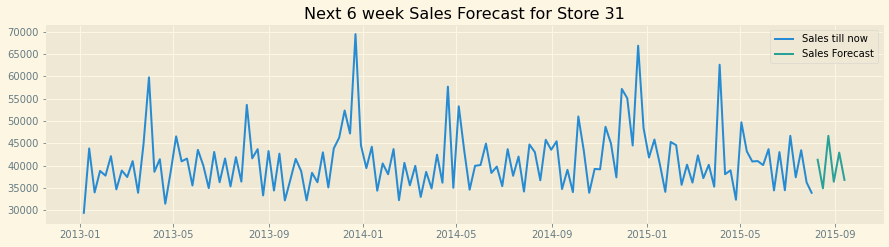

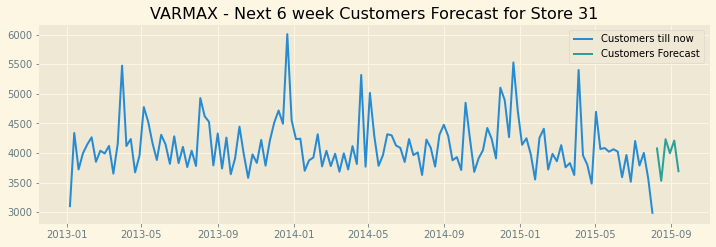

In [100]:
from statsmodels.tsa.statespace.sarimax import SARIMAXResults
mod = SARIMAX(store_all[31][['Sales']].resample('W').sum(), order=(6, 1, 6), 
              seasonal_order=(1, 1, 1, 7),exog=store_all[31][exogvariables].resample('W').sum(),trend='n') 
res = mod.fit()
result_forecast = res.forecast(steps=6,exog=traintest[8][1][exogvariables])
result_forecast = result_forecast.to_frame(name = 'Sales')

mod = SARIMAX(store_all[31][['Customers']].resample('W').sum(), order=(6, 1, 6), 
              seasonal_order=(1, 1, 1, 7),exog=store_all[31][exogvariables].resample('W').sum(),trend='n') 
res = mod.fit()
result_forecast['Customers'] = res.forecast(steps=6,exog=traintest[31][1][exogvariables])
print(result_forecast)

plt.figure(figsize=(15,8))
plt.subplot(2,1,1)
plt.plot(store_all[31]['Sales'].resample('W').sum(), label='Sales till now')
plt.plot(result_forecast['Sales'], label='Sales Forecast')
plt.title('Next 6 week Sales Forecast for Store 31')
plt.legend()
plt.show()
plt.subplot(2,1,2)
plt.plot(store_all[31]['Customers'].resample('W').sum(), label='Customers till now')
plt.plot(result_forecast['Customers'],label='Customers Forecast')
plt.title('VARMAX - Next 6 week Customers Forecast for Store 31')
plt.legend()
plt.show()

**STORE 46 : VARMAX**


/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is 

                   Sales    Customers
2015-08-09  34707.151328  3943.924925
2015-08-16  33678.962034  4181.473679
2015-08-23  39752.805382  4775.934568
2015-08-30  34275.826469  4433.964568
2015-09-06  42805.441757  5049.760763
2015-09-13  33103.234277  4331.904970


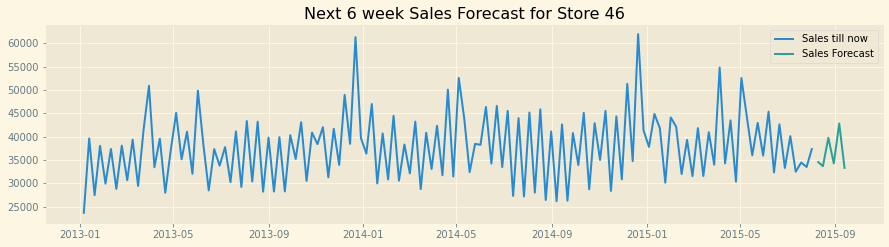

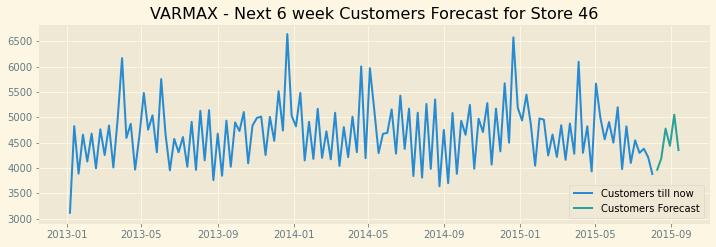

In [101]:
from statsmodels.tsa.statespace.varmax import VARMAXResults
mod = sm.tsa.VARMAX(store_all[46][['Sales','Customers']].resample('W').sum(), 
                    order=(2,2), trend='n', exog=store_all[46][exogvariables].resample('W').sum())
res = mod.fit(maxiter=1000, disp=False)
result_forecast = res.forecast(steps=6,exog=traintest[46][1][exogvariables])
print(result_forecast)

plt.figure(figsize=(15,8))
plt.subplot(2,1,1)
plt.plot(store_all[46]['Sales'].resample('W').sum(), label='Sales till now')
plt.plot(result_forecast['Sales'], label='Sales Forecast')
plt.title('Next 6 week Sales Forecast for Store 46')
plt.legend()
plt.show()
plt.subplot(2,1,2)
plt.plot(store_all[46]['Customers'].resample('W').sum(), label='Customers till now')
plt.plot(result_forecast['Customers'],label='Customers Forecast')
plt.title('VARMAX - Next 6 week Customers Forecast for Store 46')
plt.legend()
plt.show()

**Conclusion:**


Some of our important findings:

For all 9 stores, the time-series of Sales, Customers and SalePerCustomer is Stationary, as verified by ADF test.

Using the results obtained from the Grangers Causality Test, we can conclude that Sales is dependant on both Customers and SalePerCustomer

Clearly we have seen that Number of Customers have a direct impact on Sales for almost all stores.

The variables Promo and Promo2 acts as an exogenous variable and they have some influence on the overall Sales.

In almost all stores, SARIMAX model was able to beat Holt-Winter by a significant margin in terms of better Accuracy and lower MAPE values

Except for two stores : store number 8 and 31, VARMAX model has successfully beaten SARIMAX and has shown better results in terms of Accuracy and reduced MAPE scores


